<p><img alt="udeA logo" height="150px" src="https://github.com/freddyduitama/images/blob/master/logo.png?raw=true" align="left" hspace="50px" vspace="0px" style="width:107px;height:152px;"></p>
<h1><font color='0B5345'> <center>          
         Proyecto 3: Implementación de Filtros Digitales en el Procesamiento de Señales ECG </center></font></h1>
<font  face="Courier New" size="3">
<p1><center> Angie Triana - Erika Gómez - Ana Mejía </center></p1>

<p3><center><b><font color='0B5345' face="Lucida Calligraphy,Comic Sans MS,Lucida Console" size="5">Universidad de Antioquia</font></b> </center></p3>

# **1. Revisión bibliográfica**

Se realizó la revisión bibliográfica de métodos de reducción de ruido (robust LOESS y NML) y los tipos de Wavelets utilizados para el filtrado de señales ECG. En el siguiente link se encuentra el reporte de lo encontrado en la literatura: [Revisión bibliográfica Proyecto 3: Implementación de Filtros Digitales en el Procesamiento de Señales ECG](https://docs.google.com/document/d/1CW_GkDFlU9WOUC84BKYyQoGicX1NzZuIlooNmQEX6P4/edit?pli=1&tab=t.0)

# **2. Importación de funciones**

In [7]:
!pip install PyWavelets

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.signal as signal
from scipy import fft
import matplotlib.pyplot as plt;
import scipy.io as sio;
import seaborn as sns
from scipy.signal import detrend
from scipy.stats import ttest_ind, shapiro, levene, mannwhitneyu
from scipy import stats
import os
import zipfile
from scipy.signal import welch
from scipy.signal import butter, filtfilt, iirnotch
import pywt
from scipy import signal

# **3. Carga de datos**

De la base de datos "ECGData", nuestros archivos de interés corresponden a los registros pertenecientes a los pacientes con bradicardia sinusal (SB Sinus Bradycardia) y fibrilación auricular (AFIB Atrial Fibrillation). Por lo tanto, lo primero que haremos será identificar dichos archivos, partiendo de la lectura del archivo "Diagnostics.xlsx", donde se encuentra contenida la información. Una vez identificados, se obtendrá una lista con los nombres de cada archivo para cada una de las arritmias (SB y AFIB).

---

# ***3.1 Lectura de archivo "Diagnostics.xlsx"***

En primer lugar, se utilizó el archivo Diagnostics.xlsx para obtener detalles sobre los sujetos de la investigación, incluyendo factores como la edad, el género y, principalmente, el ritmo que presentan, siendo este último nuestro factor de interés.





In [9]:
#from google.colab import drive

# Conexión a Google Drive
#drive.mount('/content/drive')

path=os.getcwd()
# Ruta al archivo Diagnostics.xlsx
file_path = path + '/Diagnostics.xlsx'

# Cargar datos en un DataFrame
data_dia = pd.read_excel(file_path)

# Mostrar las primeras filas del DataFrame
data_dia.head()

,FileName,Rhythm,Beat,PatientAge,Gender,VentricularRate,AtrialRate,QRSDuration,QTInterval,QTCorrected,RAxis,TAxis,QRSCount,QOnset,QOffset,TOffset
0,MUSE_20180113_171327_27000,AFIB,RBBB TWC,85,MALE,117,234,114,356,496,81,-27,19,208,265,386
1,MUSE_20180112_073319_29000,SB,TWC,59,FEMALE,52,52,92,432,401,76,42,8,215,261,431
2,MUSE_20180111_165520_97000,SA,NONE,20,FEMALE,67,67,82,382,403,88,20,11,224,265,415
3,MUSE_20180113_121940_44000,SB,NONE,66,MALE,53,53,96,456,427,34,3,9,219,267,447
4,MUSE_20180112_122850_57000,AF,STDD STTC,73,FEMALE,162,162,114,252,413,68,-40,26,228,285,354


---


# ***3.2 Identificación de los registros con diagnóstico SB y AFIB***

A continuación, se extraen los registros correspondientes a bradicardia sinusal (SB, Sinus Bradycardia) y fibrilación auricular (AFIB, Atrial Fibrillation), que son los ritmos de interés para el análisis.

In [10]:
# Se determina la cantidad de sujetos que padecen AFIB y SB.
data_SB_name = data_dia.loc[lambda x: x["Rhythm"] == "SB", "FileName"].tolist()
data_AFIB_name = data_dia.loc[lambda x: x["Rhythm"] == "AFIB", "FileName"].tolist()

print(f"Cantidad de archivos para SB (bradicardia sinusal): {len(data_SB_name)}")
print(f"Cantidad de archivos para AFIB (fibrilación auricular): {len(data_AFIB_name)}")

Cantidad de archivos para SB (bradicardia sinusal): 3889
Cantidad de archivos para AFIB (fibrilación auricular): 1780


In [11]:
datos = []
datosfr=[]
for registro in data_SB_name:
    datos.append({'Registro': registro, 'Estado': 'SB'})
    datosfr.append(registro)

for registro in data_AFIB_name:
    datos.append({'Registro': registro, 'Estado': 'AFIB'})

    datosfr.append(registro)

df_rs = pd.DataFrame(datos)

display(df_rs )

,Registro,Estado
0,MUSE_20180112_073319_29000,SB
1,MUSE_20180113_121940_44000,SB
2,MUSE_20180112_120347_79000,SB
3,MUSE_20180114_075128_92000,SB
4,MUSE_20180118_174026_42000,SB
...,...,...
5664,MUSE_20180116_120939_86000,AFIB
5665,MUSE_20180114_134126_54000,AFIB
5666,MUSE_20180115_131040_20000,AFIB
5667,MUSE_20180116_170450_55000,AFIB


A continuación, se extraen los archivos de la carpeta "ECGData", la cual contiene señales de ECG crudas (AFIB y SB) sin procesamiento previo.

In [12]:
# Montar Google Drive
#drive.mount('/content/drive')

# Ruta a la carpeta que deseas abrir
folder_path = path + '/ECGData'

# Se listan los archivos en la carpeta
files = os.listdir(folder_path)

# Se muestra el número de archivos presentes en la carpeta.
print("Número de archivos extraídos de la carpeta 'ECGData':", len(files))

Número de archivos extraídos de la carpeta 'ECGData': 10646


---

# **4. Selección aleatoria de 10 señales para análisis en tres flujos de procesamiento distintos**


Para optimizar el gasto computacional, se seleccionan 10 señales aleatorias con AFIB y SB del archivo "ECGData" mediante la función *random.sample*. Estas señales se analizan a través de tres flujos de procesamiento distintos, con el objetivo de evaluar su rendimiento y determinar el flujo más adecuado antes de aplicarlo a todas las señales.

---

# ***4.1 Selección de señales aleatorias***

In [13]:
# Selección aleatoria de 10 sujetos con AFIB o SB.
import random

# Se inicializan los contadores
contadorSB = 0
contadorAFIB = 0

# Se seleccionan 10 sujetos al azar.
data_AFIB_SB_name_aleatoria = random.sample(datosfr, 10)
# Número de sujetos seleccionados aleatoriamente para cada patología.
for i in data_AFIB_SB_name_aleatoria:
    if i in data_SB_name:
        contadorSB += 1
    elif i in data_AFIB_name:
        contadorAFIB += 1

print(f"Cantidad de sujetos seleccionados aleatoriamente con SB (Bradicardia Sinusal): {contadorSB}")
print(f"Cantidad de sujetos seleccionados aleatoriamente con AFIB (Fibrilación Auricular): {contadorAFIB}")


Cantidad de sujetos seleccionados aleatoriamente con SB (Bradicardia Sinusal): 7
Cantidad de sujetos seleccionados aleatoriamente con AFIB (Fibrilación Auricular): 3


In [14]:
datos_alet = []
for registro in data_AFIB_SB_name_aleatoria:
    if registro in data_SB_name:
      datos_alet.append({'Registro Aleatorio': registro, 'Estado': 'SB'})

for registro in data_AFIB_SB_name_aleatoria:
  if registro in data_AFIB_name:
    datos_alet.append({'Registro Aleatorio': registro, 'Estado': 'AFIB'})

df_rsal= pd.DataFrame(datos_alet)

display(df_rsal)

,Registro Aleatorio,Estado
0,MUSE_20180112_133106_48000,SB
1,MUSE_20180112_122550_52000,SB
2,MUSE_20180116_132209_19000,SB
3,MUSE_20180119_180100_15000,SB
4,MUSE_20180118_135213_14000,SB
5,MUSE_20180112_170433_86000,SB
6,MUSE_20180118_132137_58000,SB
7,MUSE_20180115_120611_50000,AFIB
8,MUSE_20180113_125619_76000,AFIB
9,MUSE_20180112_133534_74000,AFIB


A partir de la carpeta "ECGData" extraída previamente, se cargan los archivos con registros seleccionados de manera aleatoria.

In [15]:
def cargar_dataframes_aleatorios(lista_archivos, carpeta):
    dataframes = []

    for nombre in lista_archivos:
        nombre += ".csv"
        if nombre in os.listdir(carpeta):
            ruta_archivo = os.path.join(carpeta, nombre)
            df = pd.read_csv(ruta_archivo)
            dataframes.append(df)
    return dataframes

In [16]:
dataframes_10 = cargar_dataframes_aleatorios(data_AFIB_SB_name_aleatoria, folder_path)

# ***4.2 Extracción de la derivación II a señales ECG seleccionadas aleatoriamente***

El análisis de este proyecto se enfoca en la derivación II; por ello, se extraen las señales ECG correspondientes a esta derivación para todos los registros seleccionados aleatoriamente. A estas señales se les aplicarán los flujos de procesamiento y se almacenarán en un dataframe.

In [17]:
def extraer_derivacion_II(dataframes, nombres_archivos):

    registros_II = []

    # Se itera sobre cada DataFrame y archivo en la lista de registros
    for df, archivo in zip(dataframes, nombres_archivos):
        signal_II = df["II"]  # Se extrae la columna 'II'
        registros_II.append({"Registro": archivo, "II": signal_II.values})  # Se guarda el registro y la señal

    # Se crea un DataFrame para visualizar los resultados
    df_resultado = pd.DataFrame(registros_II)
    df_resultado.set_index('Registro', inplace=True)
    return df_resultado


In [18]:
df_resultado_aleatorio = extraer_derivacion_II(dataframes_10, data_AFIB_SB_name_aleatoria)
display(df_resultado_aleatorio)

,II
Registro,
MUSE_20180112_133106_48000,"[-82.96, -82.96, -82.96, -73.2, -73.2, -68.32,..."
MUSE_20180112_122550_52000,"[78.08, 58.56, 48.8, 43.92, 43.92, 43.92, 29.2..."
MUSE_20180115_120611_50000,"[19.52, 19.52, 19.52, 19.52, 19.52, 19.52, 19...."
MUSE_20180113_125619_76000,"[107.36, 126.88, 175.68, 161.04, 151.28, 146.4..."
MUSE_20180116_132209_19000,"[68.32, 78.08, 87.84, 87.84, 92.72, 87.84, 92...."
MUSE_20180119_180100_15000,"[24.4, 9.76, 9.76, 9.76, 4.88, 0.0, -4.88, -4...."
MUSE_20180118_135213_14000,"[-73.2, -63.44, -78.08, -82.96, -63.44, -63.44..."
MUSE_20180112_133534_74000,"[-156.16, -156.16, -156.16, -156.16, -156.16, ..."
MUSE_20180112_170433_86000,"[63.44, 63.44, 53.68, 58.56, 48.8, 29.28, 39.0..."



Se grafican las señales ECG seleccionadas aleatoriamente para visualizar su comportamiento antes de aplicar los flujos de procesamiento.

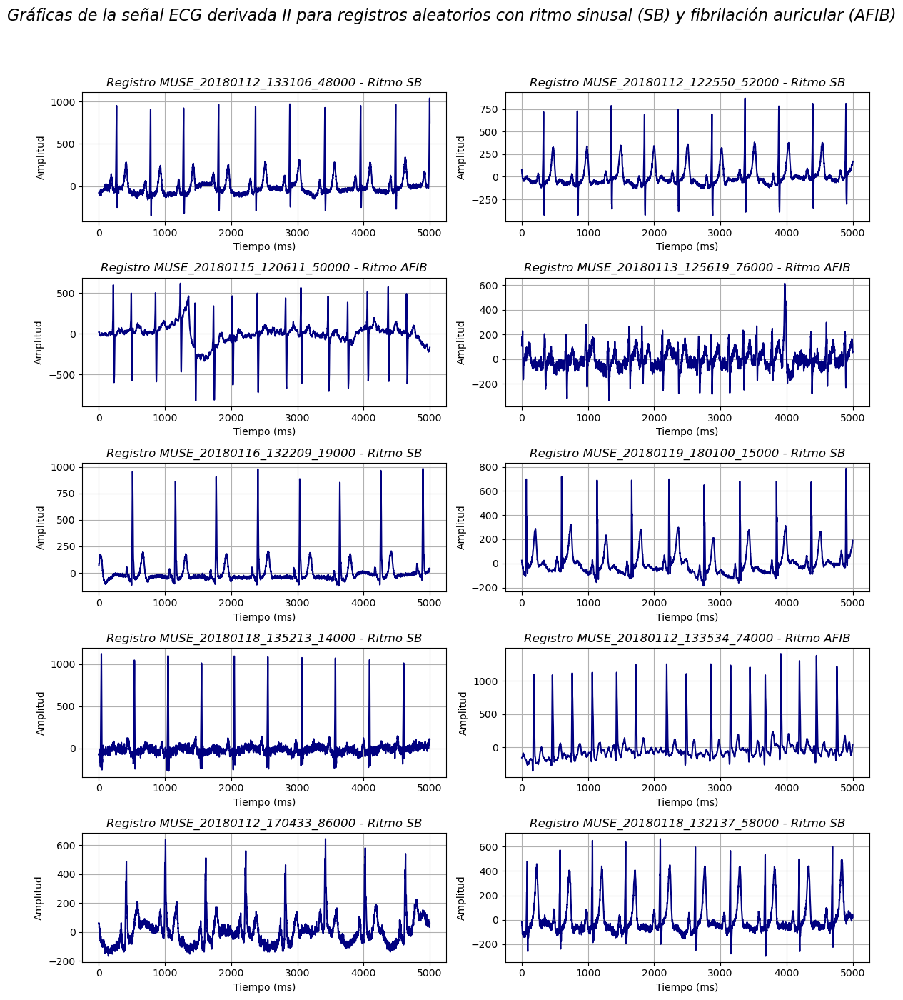

In [19]:
# Se crea una figura con un arreglo de subplots de 5 filas y 2 columnas
fig, axs = plt.subplots(5, 2, figsize=(12, 15))
fig.suptitle('Gráficas de la señal ECG derivada II para registros aleatorios con ritmo sinusal (SB) y fibrilación auricular (AFIB)', fontsize=16,fontstyle = 'italic')

# Contador para asignar cada gráfico a un subplot
contador = 0

for i in data_AFIB_SB_name_aleatoria:
    # Se verifica si el contador es menor al número total de subplots
    if contador >= 10:
        break

    # Se verifica si el registro está en la lista SB
    if i in data_SB_name:
        valor = df_resultado_aleatorio.loc[i, 'II']  # Obtiene los valores de 'II' del registro
        fila = contador // 2  # Calcula la fila del subplot
        columna = contador % 2  # Calcula la columna del subplot
        axs[fila, columna].plot(valor,'navy')  # Grafica la señal en el subplot correspondiente
        axs[fila, columna].set_title(f'Registro {i} - Ritmo SB',fontstyle = 'italic')
        axs[fila, columna].set_xlabel('Tiempo (ms)')
        axs[fila, columna].set_ylabel('Amplitud')
        axs[fila, columna].grid(True)
        contador += 1  # Incrementa el contador para el próximo subplot

    # Se verifica si el registro está en la lista AFIB
    elif i in data_AFIB_name:
        valor = df_resultado_aleatorio.loc[i, 'II']
        fila = contador // 2
        columna = contador % 2
        axs[fila, columna].plot(valor,'navy')
        axs[fila, columna].set_title(f'Registro {i} - Ritmo AFIB',fontstyle = 'italic')
        axs[fila, columna].set_xlabel('Tiempo (ms)')
        axs[fila, columna].set_ylabel('Amplitud')
        axs[fila, columna].grid(True)
        contador += 1

# Se ajusta el espacio entre subplots para una mejor visualización
plt.tight_layout(rect=[0, 0.05, 1, 0.95])
plt.show()

# ***4.3 Flujos de procesamiento***

Antes de aplicar los flujos de procesamiento indicados, es necesario analizar y seleccionar los parámetros óptimos para el filtro pasa-altas, pasa-bajas y el wavelet.

Este último determinará una respuesta en frecuencia más precisa, es decir, con una zona de transición más estrecha. Además, el orden afecta la estabilidad del filtro en el caso de los filtros IIR, el retardo de fase, la presencia de rizado (que genera oscilaciones en la respuesta en frecuencia) y el costo computacional, que aumenta con órdenes más altos.


# **Filtro Pasa-altas**





La selección de los parámetros adecuados para el filtro pasa-altas se basó en el análisis de varios factores, incluyendo el tipo de filtro lineal, ya sea de respuesta al impulso finita (FIR) o infinita (IIR). En el caso de los filtros FIR, se evaluó el comportamiento del filtro con ventanas rectangulares y Hamming, y se calculó el orden del filtro correspondiente. Para los filtros IIR, se analizaron los tipos Butterworth y Bessel.

Para el cálculo del orden del filtro pasa-altas, fue necesario aumentar el ancho de banda de 0.5 Hz a 1 Hz con el fin de obtener órdenes menores. En el cálculo del orden se consideran los siguientes factores para estimarlo:

$$
\text{Frecuencia de muestreo } f_s = 500 \, \text{Hz}
$$



$$
\text{Frecuencia de corte } f_c = 0.5 \, \text{Hz}
$$



$$
\text{Ancho de banda de transición} \ (\Delta f) = 1 \, \text{Hz}
$$







Utilizando la **ventana Rectangular**, que garantiza una desviación en la banda de paso de 8.91%:



$$
\text{Ancho de transición normalizado para la ventana seleccionada } \Delta F = \frac{0.9}{m}
$$



Finalmente, se calcula el orden:

$$
\text{Orden } (m) = \frac{\Delta F}{\Delta f / f_s} = \frac{0.9}{\Delta f / f_s} = \frac{0.9}{1 \, \text{Hz} / 500 \, \text{Hz}} = \frac{0.9}{0.002} = 450
$$


Utilizando la **ventana Hamming**, que garantiza una desviación en la banda de paso de 0.22%:



$$
\text{Ancho de transición normalizado para la ventana seleccionada } \Delta F = \frac{3.3}{m}
$$



Finalmente, se calcula el orden:

$$
\text{Orden } (m) = \frac{\Delta F}{\Delta f / f_s} = \frac{3.3}{\Delta f / f_s} = \frac{3.3}{1 \, \text{Hz} / 500 \, \text{Hz}} = \frac{3.3}{0.002} = 1650$$

El orden estimado no es necesariamente el óptimo, por lo que se realizó un proceso de prueba y error probando órdenes cercanos al valor calculado, con el fin de identificar el más adecuado según el tipo de señal. Para ello, se seleccionó una de las señales aleatorias previamente elegidas. Además, se compararon los resultados utilizando un filtro FIR (Respuesta Finita al Impulso) con ventanas rectangular y Hamming, así como un filtro IIR (Respuesta Infinita al Impulso) de tipo Butterworth y Bessel. Para evaluar estos aspectos, se generó un diagrama de Bode, que permite analizar el comportamiento en magnitud y fase, con el objetivo de seleccionar el filtro que ofrezca el mejor rendimiento.

**Frecuencia de Corte Normalizada**

$$
\text{Frecuencia de corte normalizada} = \frac{\text{Frecuencia de corte}}{\text{Frecuencia de muestreo}} = \frac{1 \, \text{Hz}}{500 \, \text{Hz}} = 0.002
$$

**Función para obtener el diagrama de bode de los filtros**

Estas funciones tiene como argumentos el numerador y el denominador de la función de transferencia, y a la salida se obtiene el diagrama de bode del filtro.

In [20]:
def freqz_highpass(b,a,order,nyq_rate = 1):

    """
    Plot the impulse response of the filter in the frequency domain

    Parameters:

        b: numerator values of the transfer function (coefficients of the filter)
        a: denominator values of the transfer function (coefficients of the filter)

        order: order of the filter

        nyq_rate = nyquist frequency
    """
    Fc1N=1/Fs
    w,h = signal.freqz(b,a);
    h_dB = 20 * np.log10 (abs(h));
    plt.figure(figsize=(20,4));
    plt.subplot(131);
    plt.plot((w/max(w))*nyq_rate,abs(h));
    plt.ylabel('Magnitude');
    plt.xlabel(r'Normalized Frequency (x$\pi$rad/sample)');
    plt.xlim(0, 0.2)
    plt.title(r'Frequency response. Order: ' + str(order));
    plt.axvline(x=Fc1N, color='r', linestyle='--', label='Fc normalizada = 0.002')
    plt.legend()
    [xmin, xmax, ymin, ymax] = plt.axis();
    plt.grid(True);

    plt.subplot(132);
    plt.plot((w/max(w))*nyq_rate,h_dB);
    plt.ylabel('Magnitude (db)');
    plt.xlabel(r'Normalized Frequency (x$\pi$rad/sample)');
    plt.xlim(0, 0.2)
    plt.title(r'Frequency response. Order: ' + str(order));
    plt.axvline(x=Fc1N, color='r', linestyle='--', label='Fc normalizada = 0.002')
    plt.legend()
    plt.grid(True)
    plt.grid(True)


    plt.subplot(133);
    h_Phase = np.unwrap(np.arctan2(np.imag(h),np.real(h)));
    plt.plot((w/max(w))*nyq_rate,h_Phase);
    plt.ylabel('Phase (radians)');
    plt.xlabel(r'Normalized Frequency (x$\pi$rad/sample)');
    plt.title(r'Phase response. Order: ' + str(order));
    plt.subplots_adjust(hspace=0.5);
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [21]:
def freqz_highpass_IRR(b,a,order,nyq_rate = 1):

    """
    Plot the impulse response of the filter in the frequency domain

    Parameters:

        b: numerator values of the transfer function (coefficients of the filter)
        a: denominator values of the transfer function (coefficients of the filter)

        order: order of the filter

        nyq_rate = nyquist frequency
    """
    Fc1N=0.5/Fs
    w,h = signal.freqz(b,a);
    h_dB = 20 * np.log10 (abs(h));
    plt.figure(figsize=(20,4));
    plt.subplot(131);
    plt.plot((w/max(w))*nyq_rate,abs(h));
    plt.ylabel('Magnitude');
    plt.xlabel(r'Normalized Frequency (x$\pi$rad/sample)');
    plt.xlim(0, 0.2)
    plt.title(r'Frequency response. Order: ' + str(order));
    plt.axvline(x=Fc1N, color='r', linestyle='--', label='Fc normalizada = 0.001')
    plt.legend()
    [xmin, xmax, ymin, ymax] = plt.axis();
    plt.grid(True);

    plt.subplot(132);
    plt.plot((w/max(w))*nyq_rate,h_dB);
    plt.ylabel('Magnitude (db)');
    plt.xlabel(r'Normalized Frequency (x$\pi$rad/sample)');
    plt.xlim(0, 0.2)
    plt.title(r'Frequency response. Order: ' + str(order));
    plt.axvline(x=Fc1N, color='r', linestyle='--', label='Fc normalizada = 0.001')
    plt.legend()
    plt.grid(True)
    plt.grid(True)


    plt.subplot(133);
    h_Phase = np.unwrap(np.arctan2(np.imag(h),np.real(h)));
    plt.plot((w/max(w))*nyq_rate,h_Phase);
    plt.ylabel('Phase (radians)');
    plt.xlabel(r'Normalized Frequency (x$\pi$rad/sample)');
    plt.title(r'Phase response. Order: ' + str(order));
    plt.subplots_adjust(hspace=0.5);
    plt.grid(True)
    plt.tight_layout()
    plt.show()

**Señal de Prueba**

In [22]:
senalPasaAltas = df_resultado_aleatorio.loc[data_AFIB_SB_name_aleatoria[0], 'II']
print("Longitud de senalPasaAltas:", len(senalPasaAltas))


Longitud de senalPasaAltas: 5000


*   **Filtro Pasa-altas FIR con Orden de 450 y Ventana Rectangular**

<Figure size 1500x500 with 0 Axes>

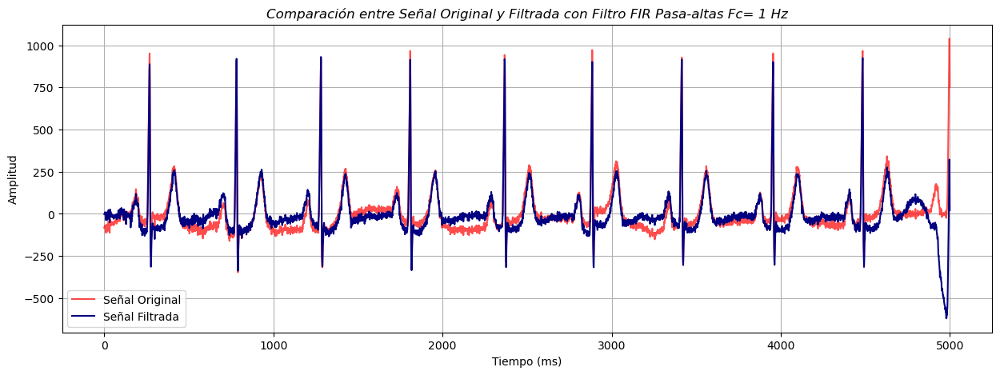

In [23]:
# Filtro pasa-altas con ancho de banda de 1 Hz y orden 450, usando ventana Rectangular.

plt.figure(figsize=(15, 5))

Fs = 500  # Frecuencia de muestreo

order = 450  # Orden

Fc1 = 1  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_hr = Fc1/nyquist # Frecuencia de corte normalizada respecto nyquist

highpass_1r = signal.firwin(order+1,wn_hr, pass_zero = 'highpass',window='rectangular') # Filtro usando ventana rectangular

FIR_highpass1r = signal.filtfilt(b=highpass_1r,a=1,x=senalPasaAltas) # Aplicación del filtro

# Se grafica la señal original y la filtrada

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(FIR_highpass1r , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro FIR Pasa-altas Fc= 1 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:




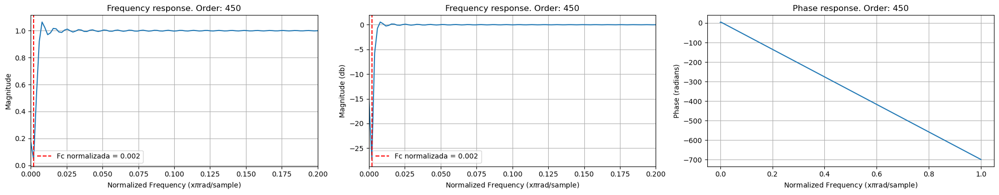

In [24]:
freqz_highpass(highpass_1r ,1,450)

**Filtro Pasa-altas FIR con Orden de 300 y Ventana Rectangular**

<Figure size 1500x500 with 0 Axes>

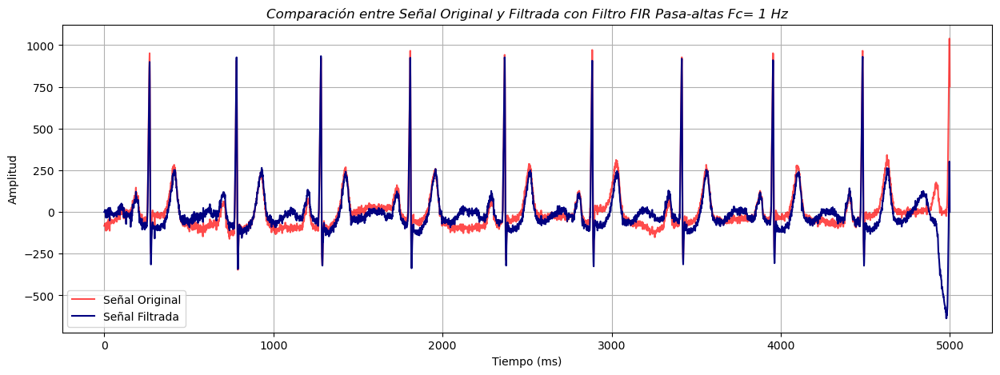

In [25]:
# Filtro pasa-altas con ancho de banda de 1 Hz y orden 300, usando ventana Rectangular

plt.figure(figsize=(15, 5))

Fs = 500  # Frecuencia de muestreo

order = 300  # Orden

Fc1 = 1  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_hr = Fc1/nyquist # Frecuencia de corte normalizada respecto nyquist

highpass_2r = signal.firwin(order+1,wn_hr, pass_zero = 'highpass',window='rectangular') # Filtro usando ventana rectangular

FIR_highpass2r = signal.filtfilt(b=highpass_2r,a=1,x=senalPasaAltas) # Aplicación del filtro

# Se grafica la señal original y la filtrada

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(FIR_highpass2r , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro FIR Pasa-altas Fc= 1 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

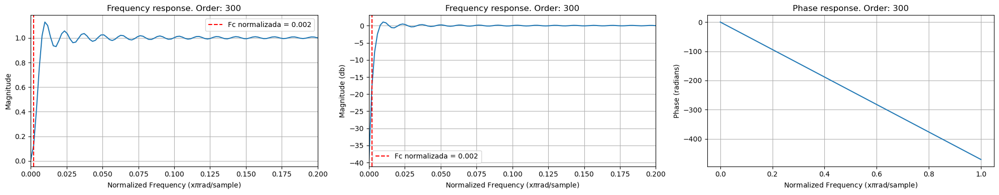

In [26]:
freqz_highpass(highpass_2r,1,300)

**Filtro Pasa-altas FIR con Orden de 200 y Ventana Rectangular**

<Figure size 1500x500 with 0 Axes>

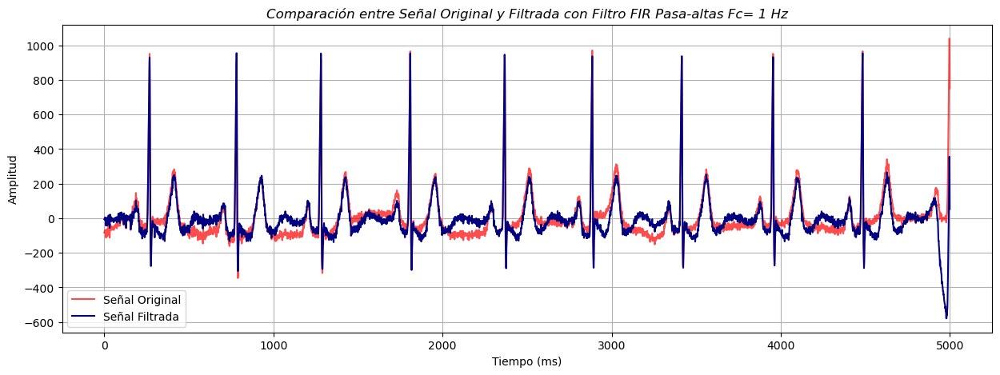

In [27]:
# Filtro pasa-altas con ancho de banda de 1 Hz y orden 200, usando ventana Rectangular

plt.figure(figsize=(15, 5))

Fs = 500  # Frecuencia de muestreo

order = 200  # Orden

Fc1 = 1  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_hr = Fc1/nyquist # Frecuencia de corte normalizada respecto nyquist

highpass_3r = signal.firwin(order+1,wn_hr, pass_zero = 'highpass',window='rectangular') # Filtro usando ventana rectangular

FIR_highpass3r = signal.filtfilt(b=highpass_3r,a=1,x=senalPasaAltas) # Aplicación del filtro

# Se grafica la señal original y la filtrada

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(FIR_highpass3r , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro FIR Pasa-altas Fc= 1 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

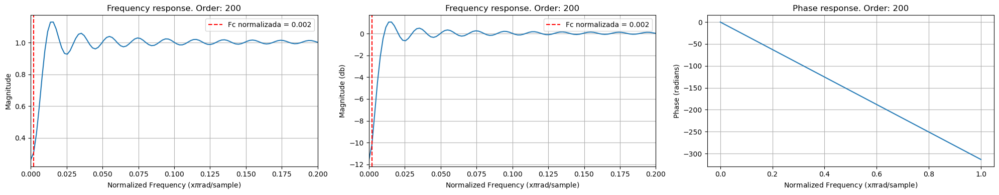

In [28]:
freqz_highpass(highpass_3r ,1,200)

*   **Filtro Pasa-altas FIR con Orden de 1650 y Ventana Hamming**

<Figure size 1500x500 with 0 Axes>

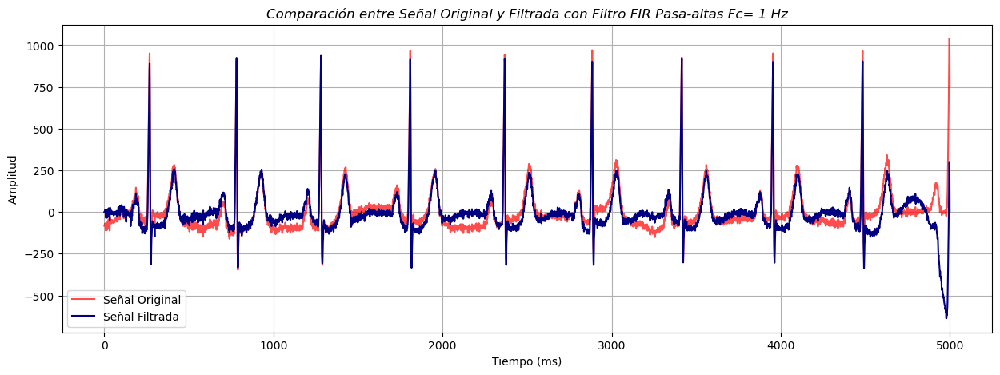

In [29]:
# Filtro pasa-altas con ancho de banda de 1 Hz y orden 1650, usando ventana Hamming

plt.figure(figsize=(15, 5))

Fs = 500  # Frecuencia de muestreo

order = 1650  # Orden

Fc1 = 1  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_hh = Fc1/nyquist # Frecuencia de corte normalizada respecto nyquist

highpass_1h = signal.firwin(order+1,wn_hh, pass_zero = 'highpass',window='hamming') # Filtro usando ventana Hamming

FIR_highpass1h = signal.filtfilt(b=highpass_1h,a=1,x=senalPasaAltas) # Aplicación del filtro

# Se grafica la señal original y la filtrada

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(FIR_highpass1h , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro FIR Pasa-altas Fc= 1 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

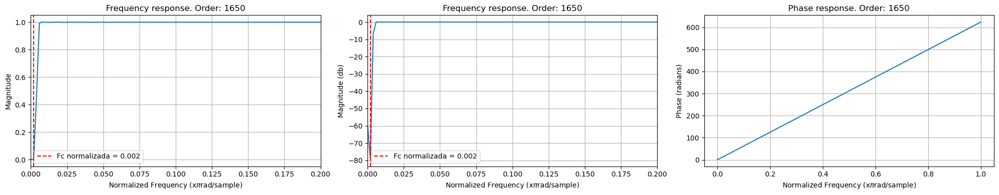

In [30]:
freqz_highpass(highpass_1h ,1,1650)

*   **Filtro Pasa-altas FIR con Orden de 1500 y Ventana Hamming**

<Figure size 1500x500 with 0 Axes>

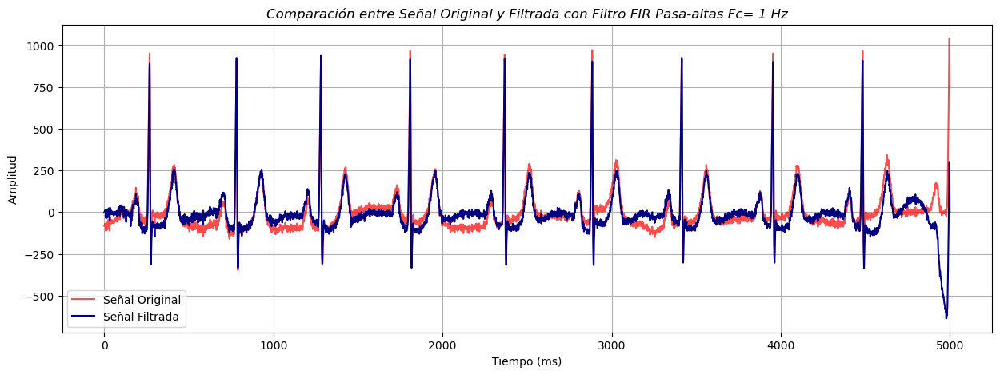

In [31]:
# Filtro pasa-altas con ancho de banda de 1 Hz y orden 1500, usando ventana Hamming

plt.figure(figsize=(15, 5))

Fs = 500  # Frecuencia de muestreo

order = 1500 # Orden

Fc1 = 1  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_hh = Fc1/nyquist # Frecuencia de corte normalizada respecto nyquist

highpass_2h = signal.firwin(order+1,wn_hh, pass_zero = 'highpass',window='hamming') # Filtro usando ventana Hamming

FIR_highpass2h = signal.filtfilt(b=highpass_2h,a=1,x=senalPasaAltas) # Aplicación del filtro

# Se grafica la señal original y la filtrada

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(FIR_highpass2h , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro FIR Pasa-altas Fc= 1 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

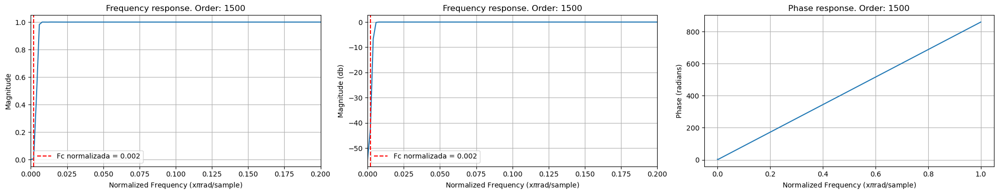

In [32]:
freqz_highpass(highpass_2h ,1, 1500)

*   **Filtro Pasa-altas IIR con Orden de 4 Tipo Butterworth**

<Figure size 1500x600 with 0 Axes>

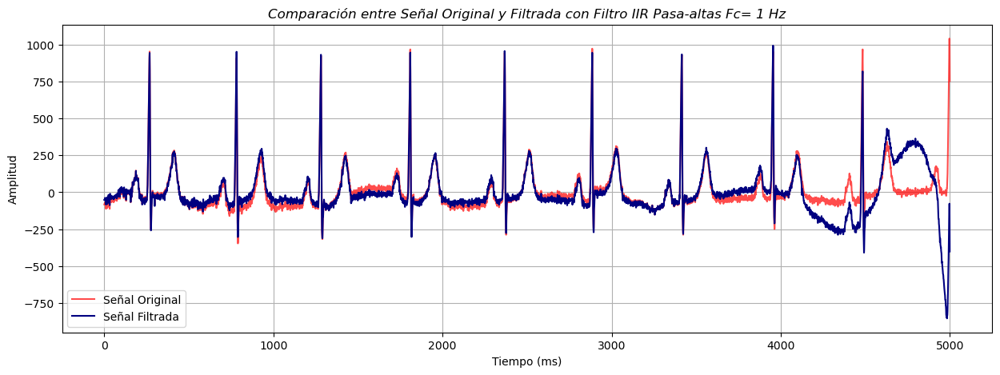

In [33]:
# Filtro pasa-altas con ancho de banda de 1 Hz  y orden 4, Tipo Butterworth
plt.figure(figsize=(15, 6))

Fs = 500  # Frecuencia de muestreo

order = 4  # Orden

Fc1 = 0.5 # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_high1 = Fc1 / nyquist # Frecuencia de corte normalizada respecto nyquist

b_high1, a_high1 = signal.iirfilter(order, wn_high1, btype='high',analog=False, ftype='butter')

IIR_highpass1h = signal.filtfilt(b=b_high1, a=a_high1, x=senalPasaAltas)

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(IIR_highpass1h , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro IIR Pasa-altas Fc= 1 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

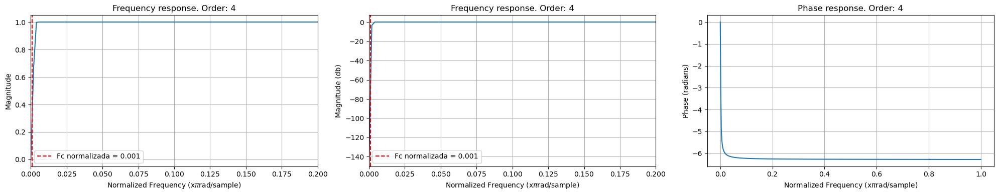

In [34]:
freqz_highpass_IRR(b_high1 ,a_high1, 4)

*   **Filtro Pasa-altas IIR con Orden de 4 Tipo Bessel**



<Figure size 1500x600 with 0 Axes>

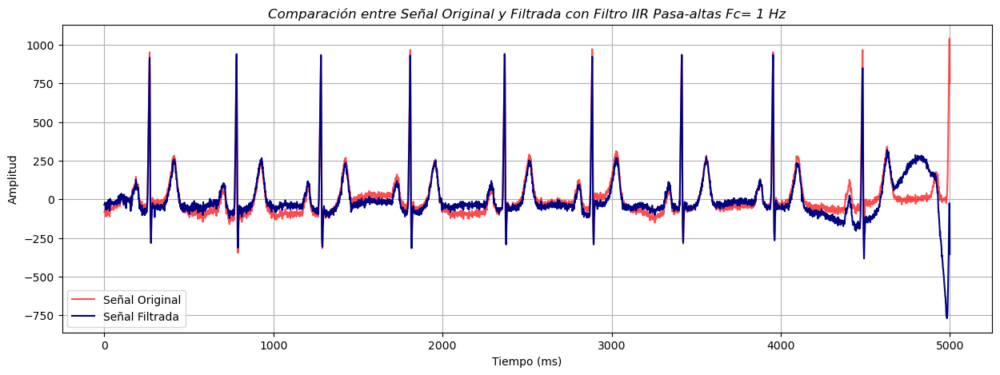

In [35]:
# Filtro pasa-altas con ancho de banda de 1 Hz y orden 4, Tipo Bessel
plt.figure(figsize=(15, 6))

Fs = 500  # Frecuencia de muestreo

order = 4  # Orden

Fc1 = 0.5  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_high2 = Fc1 / nyquist # Frecuencia de corte normalizada respecto nyquist

b_high2, a_high2 = signal.iirfilter(order, wn_high1, btype='high',analog=False, ftype='bessel')

IIR_highpass2h = signal.filtfilt(b=b_high2, a=a_high2, x=senalPasaAltas)

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(IIR_highpass2h , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro IIR Pasa-altas Fc= 1 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

C:\Users\erika\AppData\Local\Temp\ipykernel_40696\1567820195.py:17: RuntimeWarning: divide by zero encountered in log10
  h_dB = 20 * np.log10 (abs(h));


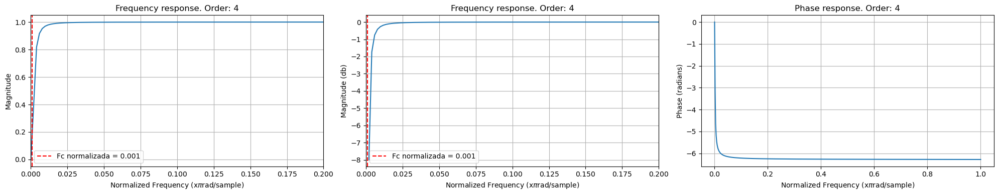

In [36]:
freqz_highpass_IRR(b_high2 ,a_high2, 4)


***Selección del Filtro Pasa-altas***

Para seleccionar el filtro pasa-altas, en los filtros FIR fue necesario ampliar la banda de transición a 1 Hz. Esto se debe a que, con una frecuencia de corte tan baja como 0.5 Hz, los órdenes del filtro resultan muy altos, lo cual aumenta el costo computacional y complica el procesamiento de las señales. Además, este ajuste ayuda a mitigar problemas con la ventana Hamming, especialmente dada la longitud de las señales ECG.

En el análisis de los resultados obtenidos con los filtros FIR e IIR, se tuvieron en cuenta varios aspectos: En los filtros FIR, se presentaron mejores resultados al utilizar la ventana Hamming en comparación con la ventana rectangular. La ventana rectangular muestra un mayor rizado en la banda pasante, lo cual genera distorsión en la señal y una atenuación que se extiende más allá de la frecuencia de corte, afectando frecuencias de interés. En cambio, la ventana Hamming permite que la atenuación de la señal comience más cerca de la frecuencia de corte, aunque no respeta completamente dicha frecuencia.

En términos de fase, el uso de la ventana Hamming produjo una fase lineal con un adelanto considerable, mientras que la ventana rectangular también genera una fase lineal, pero con un ligero retraso en la señal. Este comportamiento era esperado, ya que el uso de un orden tan elevado  puede introducir distorsión en la fase para ambas ventanas. Así mismo, en comparación con la ventana rectangular, la ventana Hamming efectivamente reduce el rizado en la banda pasante y en la banda atenuada, pero a costa de ensanchar la banda de transición, lo que afecta la precisión de la frecuencia de corte  [1].

Por otro lado, para la implementación de los filtros IIR, se consideró un orden menor de 4, ya que aumentar demasiado el orden puede causar inestabilidad en el filtro. Se analizaron dos tipos de filtros IIR: Butterworth y Bessel. En los diagramas de magnitud, ambas tipologías mostraron una banda pasante bastante plana; sin embargo, el filtro Butterworth presentó una frecuencia de atenuación más precisa que el filtro Bessel. En cuanto a la fase, ambas tipologías causaron distorsión, lo cual era esperado, ya que los filtros IIR tienden a introducir distorsiones en la fase [2].

En general, los filtros IIR ofrecieron mejores resultados en comparación con los filtros FIR, ya que presentaron una banda pasante más plana, mayor selectividad en la frecuencia de corte, una pendiente más pronunciada (lo que se traduce en una mejor atenuación), y un menor gasto computacional gracias al uso de un orden tan bajo. Por estas razones, se seleccionó el *filtro IIR de orden 4 y tipo Butterworth* como el más adecuado para implementar en los flujos de procesamiento.



# **Filtro Pasa-bajas**

La selección de los parámetros adecuados para el filtro pasa-bajas se basó en el análisis de varios factores, incluyendo el tipo de filtro lineal, ya sea de respuesta al impulso finita (FIR) o infinita (IIR). En el caso de los filtros FIR, se evaluó el comportamiento del filtro con ventanas rectangulares y Hamming, y se calculó el orden del filtro correspondiente. Para los filtros IIR, se analizaron los tipos Butterworth y Bessel.

Para el filtro pasa-bajas con una frecuencia de corte de 50 Hz, se consideran los siguientes factores para estimar el orden:

$$
\text{Frecuencia de muestreo } f_s = 500 \, \text{Hz}
$$



$$
\text{Frecuencia de corte } f_c = 50  \, \text{Hz}
$$



$$
\text{Ancho de banda de transición} \ (\Delta f) = 50 \, \text{Hz}  
$$







Utilizando la ventana Rectangular, que garantiza una desviación en la banda de paso de 8.91%:



$$
\text{Ancho de transición normalizado para la ventana seleccionada } \Delta F = \frac{0.9}{m}
$$



Finalmente, se calcula el orden:

$$
\text{Orden } (m) = \frac{\Delta F}{\Delta f / f_s} = \frac{0.9}{\Delta f / f_s} = \frac{0.9}{50 \, \text{Hz} / 500 \, \text{Hz}} = \frac{0.9}{0.1} = 9
$$

Utilizando la ventana Hamming, que garantiza una desviación en la banda de paso de 0.22%:



$$
\text{Ancho de transición normalizado para la ventana seleccionada } \Delta F = \frac{3.3}{m}
$$



Finalmente, se calcula el orden:

$$
\text{Orden } (m) = \frac{\Delta F}{\Delta f / f_s} = \frac{3.3}{\Delta f / f_s} = \frac{3.3}{50 \, \text{Hz} / 500 \, \text{Hz}} = \frac{3.3}{0.1} =33 $$

Similar al filtro pasa altas, el orden estimado no es necesariamente el óptimo, por lo que se realizó un proceso de prueba y error probando órdenes cercanos al valor calculado, con el fin de identificar el más adecuado según el tipo de señal. Para ello, se seleccionó una de las señales aleatorias previamente elegidas. Además, se compararon los resultados utilizando un filtro FIR (Respuesta Finita al Impulso) con ventanas rectangular y Hamming, así como un filtro IIR (Respuesta Infinita al Impulso) de tipo Butterworth y Bessel. Para evaluar estos aspectos, se generó un diagrama de Bode, que permite analizar el comportamiento en magnitud y fase, con el objetivo de seleccionar el filtro que ofrezca el mejor rendimiento.

**Frecuencia de Corte Normalizada**

$$
\text{Frecuencia de corte normalizada} = \frac{\text{Frecuencia de corte}}{\text{Frecuencia de muestreo}} = \frac{50 \, \text{Hz}}{500 \, \text{Hz}} = 0.1
$$

**Función para obtener el diagrama de bode de los filtros**

Estas funciones tiene como argumentos el numerador y el denominador de la función de transferencia, y a la salida se obtiene el diagrama de bode del filtro.

In [37]:
def freqz_lowpass(b,a,order,nyq_rate = 1):

    """
    Plot the impulse response of the filter in the frequency domain

    Parameters:

        b: numerator values of the transfer function (coefficients of the filter)
        a: denominator values of the transfer function (coefficients of the filter)

        order: order of the filter

        nyq_rate = nyquist frequency
    """
    Fc2N=50/Fs
    w,h = signal.freqz(b,a);
    h_dB = 20 * np.log10 (abs(h));
    plt.figure(figsize=(20,4));
    plt.subplot(131);
    plt.plot((w/max(w))*nyq_rate,abs(h));
    plt.ylabel('Magnitude');
    plt.xlabel(r'Normalized Frequency (x$\pi$rad/sample)');
    plt.title(r'Frequency response. Order: ' + str(order));
    plt.axvline(x=Fc2N, color='r', linestyle='--', label='Fc normalizada = 0.1')
    plt.legend()
    [xmin, xmax, ymin, ymax] = plt.axis();
    plt.grid(True);

    plt.subplot(132);
    plt.plot((w/max(w))*nyq_rate,h_dB);
    plt.ylabel('Magnitude (db)');
    plt.xlabel(r'Normalized Frequency (x$\pi$rad/sample)');
    plt.title(r'Frequency response. Order: ' + str(order));
    plt.axvline(x=Fc2N, color='r', linestyle='--', label='Fc normalizada = 0.1  ')
    plt.legend()
    plt.grid(True)
    plt.grid(True)


    plt.subplot(133);
    h_Phase = np.unwrap(np.arctan2(np.imag(h),np.real(h)));
    plt.plot((w/max(w))*nyq_rate,h_Phase);
    plt.ylabel('Phase (radians)');
    plt.xlabel(r'Normalized Frequency (x$\pi$rad/sample)');
    plt.title(r'Phase response. Order: ' + str(order));
    plt.subplots_adjust(hspace=0.5);
    plt.grid(True)
    plt.tight_layout()
    plt.show()

*   **Filtro Pasa-bajas FIR con Orden de 9 y Ventana Rectangular**

<Figure size 1500x500 with 0 Axes>

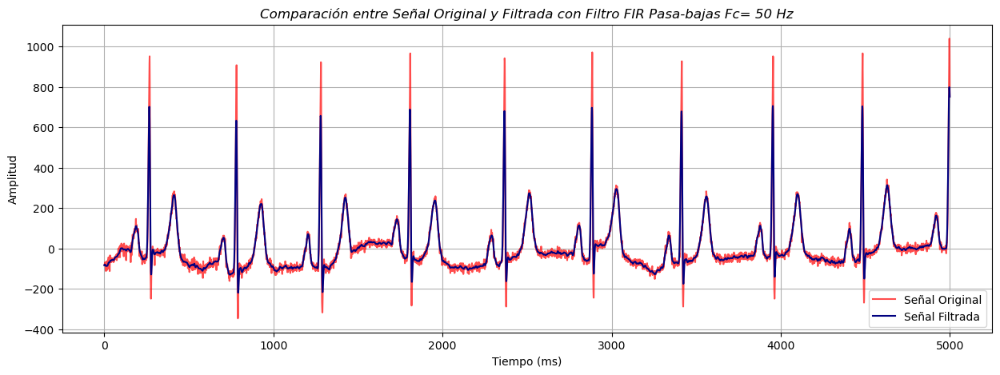

In [38]:
# Filtro pasa-bajas con ancho de banda de 50 Hz y orden 9, usando ventana Rectangular

plt.figure(figsize=(15, 5))

Fs = 500  # Frecuencia de muestreo

orderlow = 9  # Orden

Fc2 = 50  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_lr = Fc2/nyquist # Frecuencia de corte normalizada respecto nyquist

lowpass_1r = signal.firwin(orderlow+1,wn_lr, pass_zero = 'lowpass',window='rectangular') # Filtro usando ventana rectangular

FIR_lowpass1r = signal.filtfilt(b=lowpass_1r,a=1,x=senalPasaAltas) # Aplicación del filtro

# Se grafica la señal original y la filtrada

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(FIR_lowpass1r , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro FIR Pasa-bajas Fc= 50 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

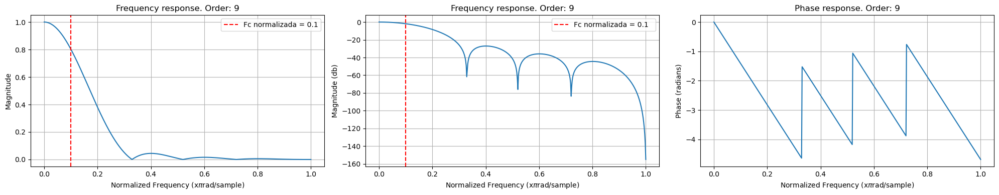

In [39]:
freqz_lowpass(lowpass_1r,1,9)

*   **Filtro Pasa-bajas FIR con Orden de 5 y Ventana Rectangular**

<Figure size 1500x500 with 0 Axes>

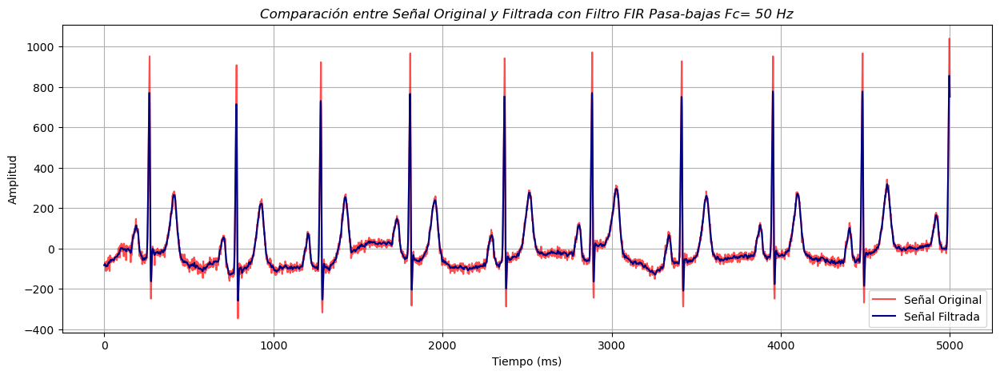

In [40]:
# Filtro pasa-bajas con ancho de banda de 50 Hz y orden 5, usando ventana Rectangular

plt.figure(figsize=(15, 5))

Fs = 500  # Frecuencia de muestreo

orderlow2 = 5  # Orden

Fc2 = 50  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_lr = Fc2/nyquist # Frecuencia de corte normalizada respecto nyquist

lowpass_2r = signal.firwin(orderlow2+1,wn_lr, pass_zero = 'lowpass',window='rectangular') # Filtro usando ventana rectangular

FIR_lowpass2r = signal.filtfilt(b=lowpass_2r,a=1,x=senalPasaAltas) # Aplicación del filtro

# Se grafica la señal original y la filtrada

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(FIR_lowpass2r , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro FIR Pasa-bajas Fc= 50 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

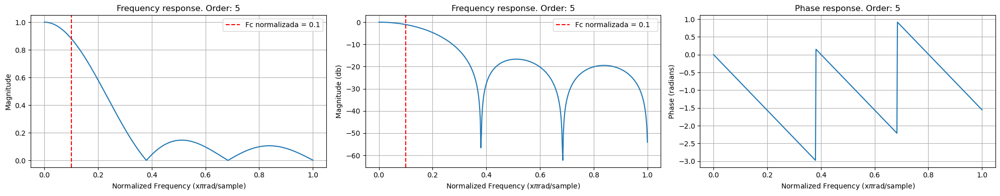

In [41]:
freqz_lowpass(lowpass_2r,1,5)

*   **Filtro Pasa-bajas FIR con Orden de 12 y Ventana Rectangular**

<Figure size 1500x500 with 0 Axes>

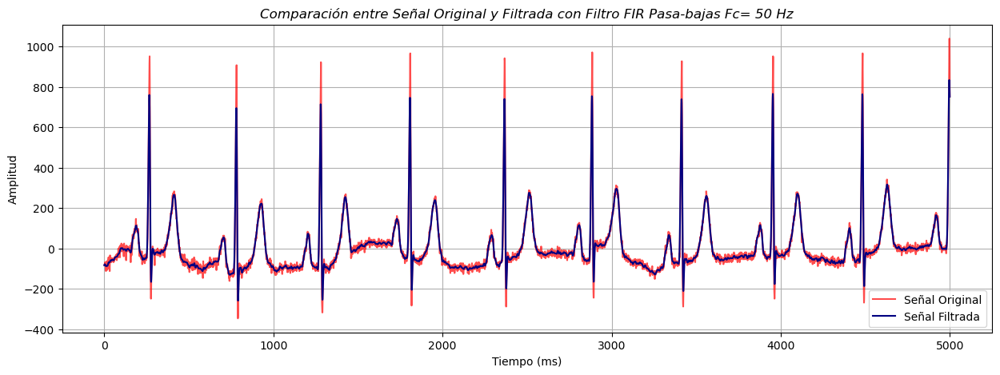

In [42]:
# Filtro pasa-bajas con ancho de banda de 50 Hz y orden 12, usando ventana Rectangular

plt.figure(figsize=(15, 5))

Fs = 500  # Frecuencia de muestreo

orderlow3 = 12  # Orden

Fc2 = 50  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_lr = Fc2/nyquist # Frecuencia de corte normalizada respecto nyquist

lowpass_3r = signal.firwin(orderlow3+1,wn_lr, pass_zero = 'lowpass',window='rectangular') # Filtro usando ventana rectangular

FIR_lowpass3r = signal.filtfilt(b=lowpass_3r,a=1,x=senalPasaAltas) # Aplicación del filtro

# Se grafica la señal original y la filtrada

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(FIR_lowpass3r , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro FIR Pasa-bajas Fc= 50 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

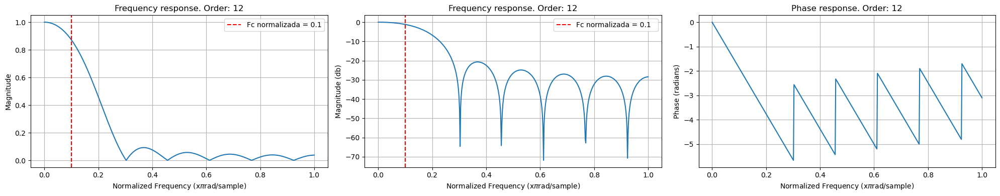

In [43]:
freqz_lowpass(lowpass_3r,1,12)

*   **Filtro Pasa-bajas FIR con Orden de 33 y Ventana Hamming**




<Figure size 1500x500 with 0 Axes>

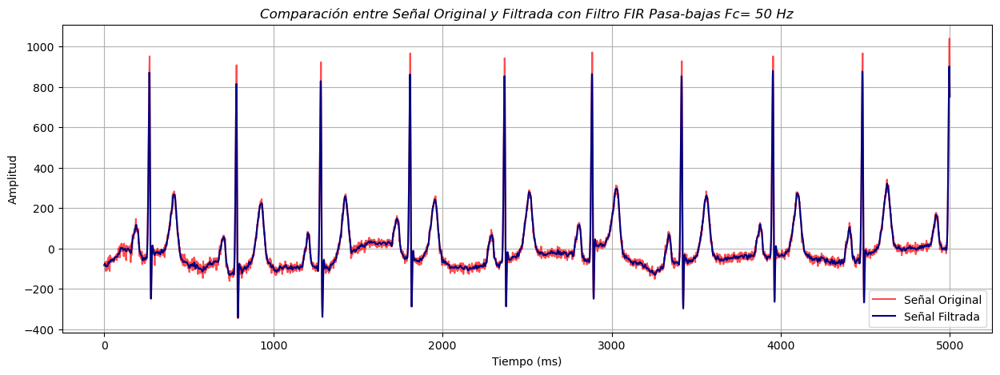

In [44]:
# Filtro pasa-bajas con ancho de banda de 50 Hz y orden 33, usando ventana Hamming

plt.figure(figsize=(15, 5))

Fs = 500  # Frecuencia de muestreo

orderlow = 33  # Orden

Fc2 = 50  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_lr = Fc2/nyquist # Frecuencia de corte normalizada respecto nyquist

lowpass_h = signal.firwin(orderlow+1,wn_lr, pass_zero = 'lowpass',window='hamming') # Filtro usando ventana Hamming

FIR_lowpassh = signal.filtfilt(b=lowpass_h,a=1,x=senalPasaAltas) # Aplicación del filtro

# Se grafica la señal original y la filtrada

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(FIR_lowpassh , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro FIR Pasa-bajas Fc= 50 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

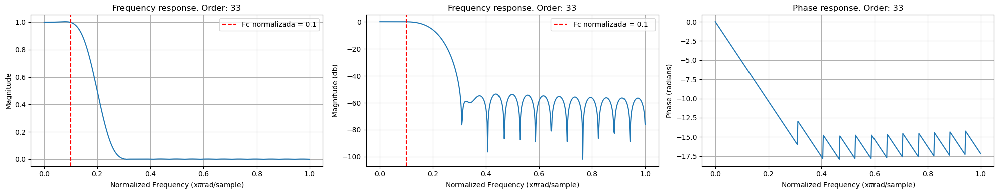

In [45]:
freqz_lowpass(lowpass_h,1,33)

*   **Filtro Pasa-bajas FIR con Orden de 25 y Ventana Hamming**

<Figure size 1500x500 with 0 Axes>

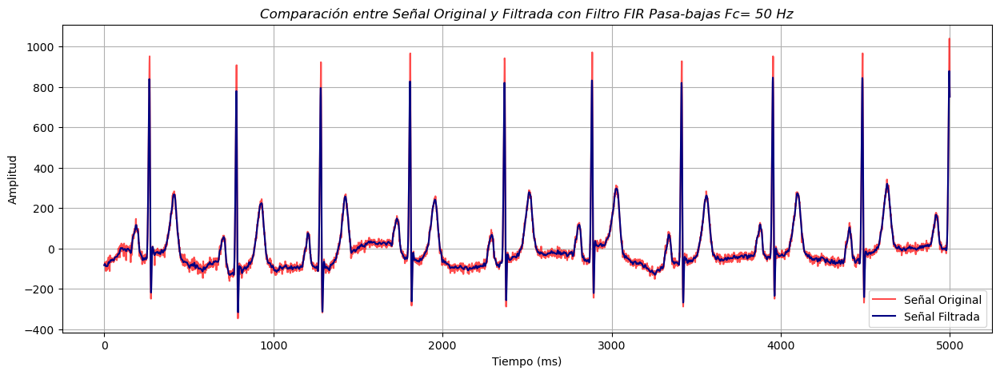

In [46]:
# Filtro pasa-bajas con ancho de banda de 50 Hz y orden 25, usando ventana Hamming

plt.figure(figsize=(15, 5))

Fs = 500  # Frecuencia de muestreo

orderlow1 = 25  # Orden

Fc2 = 50  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_lr = Fc2/nyquist # Frecuencia de corte normalizada respecto nyquist

lowpass_h1 = signal.firwin(orderlow1+1,wn_lr, pass_zero = 'lowpass',window='hamming') # Filtro usando ventana Hamming

FIR_lowpassh1 = signal.filtfilt(b=lowpass_h1,a=1,x=senalPasaAltas) # Aplicación del filtro

# Se grafica la señal original y la filtrada

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(FIR_lowpassh1 , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro FIR Pasa-bajas Fc= 50 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

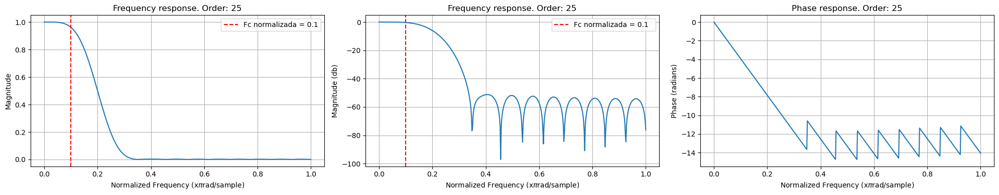

In [47]:
freqz_lowpass(lowpass_h1,1,25)

*   **Filtro Pasa-bajas FIR con Orden de 40 y Ventana Hamming**

<Figure size 1500x500 with 0 Axes>

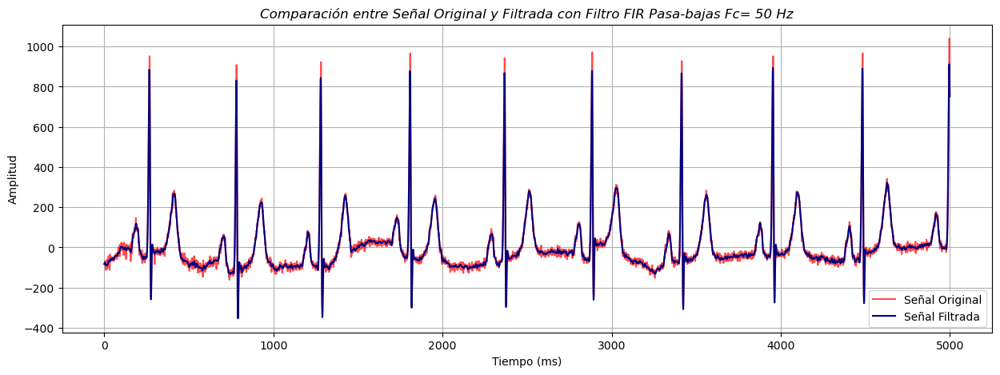

In [48]:
# Filtro pasa-bajas con ancho de banda de 50 Hz y orden 40, usando ventana Hamming

plt.figure(figsize=(15, 5))

Fs = 500  # Frecuencia de muestreo

orderlow3 = 40 # Orden

Fc2 = 50  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_lr = Fc2/nyquist # Frecuencia de corte normalizada respecto nyquist

lowpass_h2 = signal.firwin(orderlow3+1,wn_lr, pass_zero = 'lowpass',window='hamming') # Filtro usando ventana Hamming

FIR_lowpassh2 = signal.filtfilt(b=lowpass_h2,a=1,x=senalPasaAltas) # Aplicación del filtro

# Se grafica la señal original y la filtrada

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(FIR_lowpassh2 , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro FIR Pasa-bajas Fc= 50 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

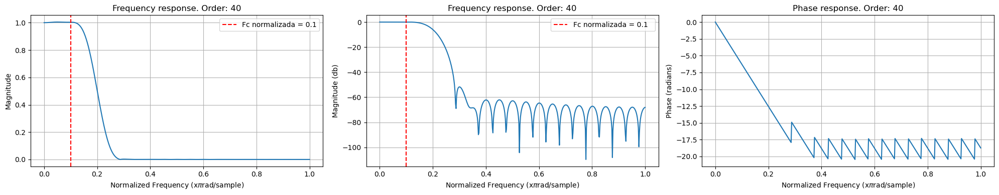

In [49]:
freqz_lowpass(lowpass_h2,1,40)

*   **Filtro Pasa-bajas IIR con Orden 3 de  Tipo Butterworth**

<Figure size 1500x600 with 0 Axes>

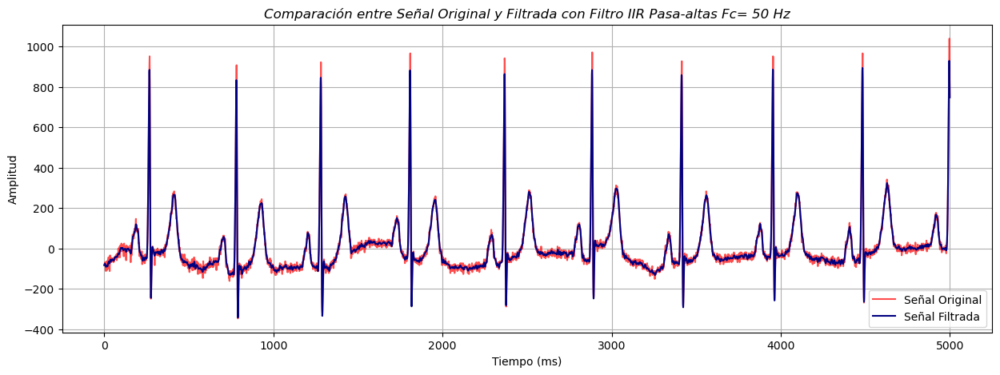

In [50]:
# Filtro pasa-bajas con frecuencia de corte de 50 Hz y orden 3, Tipo Butterworth
plt.figure(figsize=(15, 6))

Fs = 500  # Frecuencia de muestreo

order1 = 3  # Orden

Fc2 = 50  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_low1 = Fc2 / nyquist # Frecuencia de corte normalizada respecto nyquist

b_lowir1, a_lowir1 = signal.iirfilter(order1, wn_low1, btype='low',analog=False, ftype='butter')

IIR_lowpass1 = signal.filtfilt(b=b_lowir1, a=a_lowir1, x=senalPasaAltas)

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(IIR_lowpass1 , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro IIR Pasa-altas Fc= 50 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

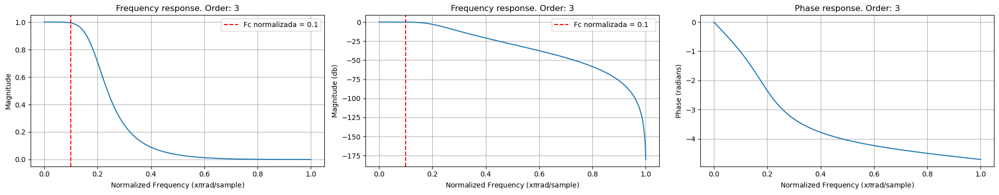

In [51]:
freqz_lowpass(b_lowir1,a_lowir1,3)

*   **Filtro Pasa-bajas IIR con Orden 3 de  Tipo bessel**

<Figure size 1500x600 with 0 Axes>

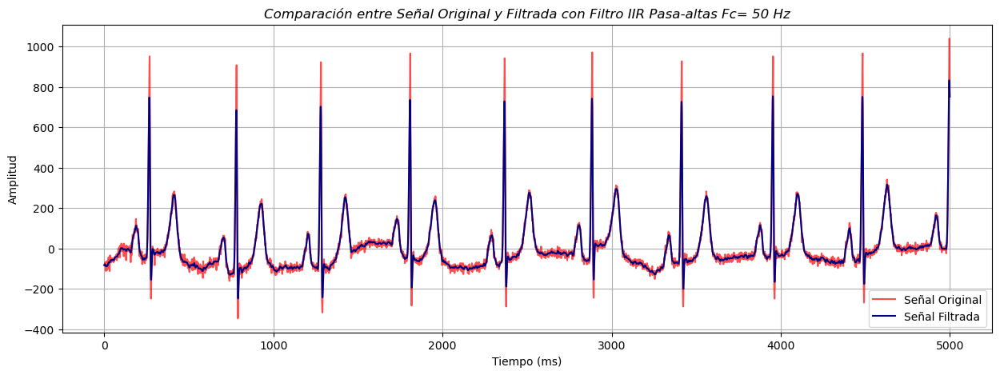

In [52]:
# Filtro pasa-altas con frecuencia de corte de 50 Hz y orden 3, Tipo bessel
plt.figure(figsize=(15, 6))

Fs = 500  # Frecuencia de muestreo

order2 = 3  # Orden

Fc2 = 50  # Frecuencia de corte

nyquist = Fs / 2  # Frecuencia de Nyquist

wn_low1 = Fc2 / nyquist # Frecuencia de corte normalizada respecto nyquist

b_lowir2, a_lowir2 = signal.iirfilter(order2, wn_low1, btype='low',analog=False, ftype='bessel')

IIR_lowpass2 = signal.filtfilt(b=b_lowir2, a=a_lowir2, x=senalPasaAltas)

plt.figure(figsize=(15, 5))
plt.plot(senalPasaAltas, label='Señal Original', color='red', alpha=0.7)  # Señal original
plt.plot(IIR_lowpass2 , label='Señal Filtrada', color='navy')  # Señal filtrada

plt.xlabel("Tiempo (ms)")
plt.ylabel("Amplitud")
plt.title("Comparación entre Señal Original y Filtrada con Filtro IIR Pasa-altas Fc= 50 Hz", fontstyle='italic')
plt.grid()
plt.legend() # Se muestra la leyenda
plt.show()

Realizamos un análisis de la respuesta en frecuencia utilizando el diagrama de Bode:

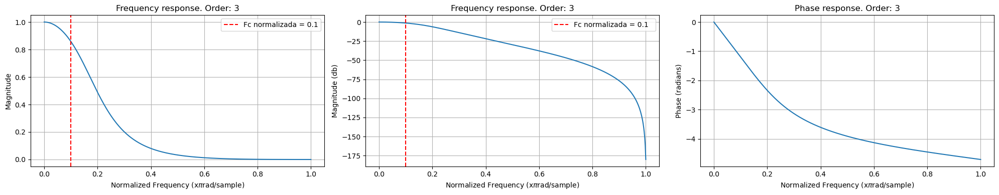

In [53]:
freqz_lowpass(b_lowir2,a_lowir2,3)

***Selección de Filtro Pasa Bajas***

En el análisis de los resultados obtenidos con los filtros FIR e IIR, se consideraron varios aspectos clave. En los filtros FIR, tanto la ventana rectangular como la ventana Hamming mostraron rizado en la banda de rechazo, lo cual permite la introducción de ruido de alta frecuencia en la señal ECG, afectando su análisis posterior. Sin embargo, la ventana Hamming mostró una mayor selectividad en la frecuencia de corte en comparación con la ventana rectangular. En cuanto a la fase, ambas ventanas (Hamming y rectangular) produjeron una distorsión de fase en la señal, generando diferentes retardos en distintas frecuencias.

Por otro lado, nuevamente para la implementación de los filtros IIR, se consideró un orden menor de 3, ya que aumentar demasiado el orden puede causar inestabilidad en el filtro. Se analizaron dos tipos de filtros IIR: Butterworth y Bessel. En los diagramas de magnitud, ambas tipologías mostraron una banda pasante y de rechazo bastante plana; sin embargo, el filtro Butterworth presentó una frecuencia de corte más precisa que el filtro Bessel. En cuanto a la fase, ambas tipologías causaron distorsión, lo cual era esperado, ya que los filtros IIR tienden a introducir distorsiones en la fase [2].

En general, los filtros IIR ofrecieron mejores resultados en comparación con los filtros FIR, ya que presentaron una banda de rechazo más plana, una menor distorsión en la fase, y un menor gasto computacional gracias al uso de un orden tan bajo. Por estas razones, se seleccionó el *filtro IIR con Orden 3 de  Tipo Butterworth* como el más adecuado para implementar en los flujos de procesamiento.


**Funciones filtros pasa altas y pasa bajas**

In [54]:
# Definir función para filtro pasa-altas (IIR) a 1 Hz
def filtro_pasa_altas(data, fs, cutoff=1):
    nyquist = fs / 2
    b, a = signal.iirfilter(4, cutoff / nyquist, btype='highpass', analog=False)
    return filtfilt(b, a, data)

# Definir función para filtro pasa-bajas (IIR) a 50 Hz
def filtro_pasa_bajas(data, fs, cutoff=50):
    nyquist = fs / 2
    b, a = signal.iirfilter(3, cutoff / nyquist, btype='lowpass', analog=False)
    return filtfilt(b, a, data)

# **Filtro Wavelet**

De acuerdo a la revisión bibliográfica realizada, en diferentes estudios se ha reportado que los mejores resultados de filtrado para señales ECG se han obtenido con la familia de wavelets Daubechies, específicamente Db3. Adicionalmente, se recomienda conservar los niveles en un rango de 1-7.  

Para nuestra señal, que tiene una longitud de 5000 datos, el número de niveles máximos es de 12. No obstante, no se recomiendan niveles mayores a 8. Se evaluaron niveles 4, 5 y 6. No obstante, presentaban ruido, por lo que se optó un nivel de 2. 

In [55]:
def wavelet_filter(data, wavelet, level):
    """
    Esta función realiza el filtrado de la señal ECG utilizando la transformación de wavelet.
    Se utiliza el proceso de umbralización para eliminar aquellos detalles que no superan cierto nivel de ruido.

    Parámetros de la función:

    data: La señal ECG a filtrar.
    wavelet: El tipo de familia wavelet que se implementará.
    level: El nivel de descomposición wavelet.

    Retorna:

    signal_rec: La señal filtrada reconstruida en el tiempo.
    """

    # Estimación del ruido en cada nivel de los coeficientes de la descomposición
    def wnoisest(coeff):
        stdc = np.zeros((len(coeff), 1))
        for i in range(0, len(coeff)):
            stdc[i] = (np.median(np.absolute(coeff[i])))/0.6745
        return stdc

    # Cálculo del umbral a aplicar a los coeficientes
    def threshold(coeff):
        Num_samples = 0
        for i in range(0, len(coeff)):
            Num_samples = Num_samples + coeff[i].shape[0]
        return np.sqrt(2 * np.log(Num_samples))

    # Umbralización de los coeficientes
    def wthresh(coeff):
        y = list()
        s = wnoisest(coeff)
        thr = threshold(coeff)

        for i in range(0, len(coeff)):
            y.append(np.multiply(coeff[i], np.abs(coeff[i]) > (thr * s[i])))  # Aplicar thresholding

        return thr, s, y

    # Descomposición wavelet de la señal
    data_wavelet = pywt.wavedec(data, wavelet, level=level)
    details = data_wavelet[1:]  # Coeficientes de los detalles (excluyendo la aproximación)

    # Aplicación del umbral a los coeficientes de los detalles
    thr, s, details_t = wthresh(details)

    # Reconstrucción de los coeficientes con los detalles umbralizados
    coeff = [data_wavelet[0]]  # Añadir la aproximación sin cambios
    coeff.extend(details_t)  # Añadir los detalles umbralizados

    # Reconstrucción de la señal filtrada
    signal_rec = pywt.waverec(coeff, wavelet)
    signal_rec = signal_rec[0:data.shape[0]]  # Ajustar la longitud de la señal reconstruida

    return signal_rec

***Evaluación del filtro Wavelet en el flujo de procesamiento 2***

# ***4.3.1 Flujos de procesamiento de señales***


***Flujo de procesamiento 1***


1. Filtro pasa-altas a 0.5 Hz.

2. Filtro wavelet modificado. 

3. Filtro pasa-bajas a 50 Hz. 

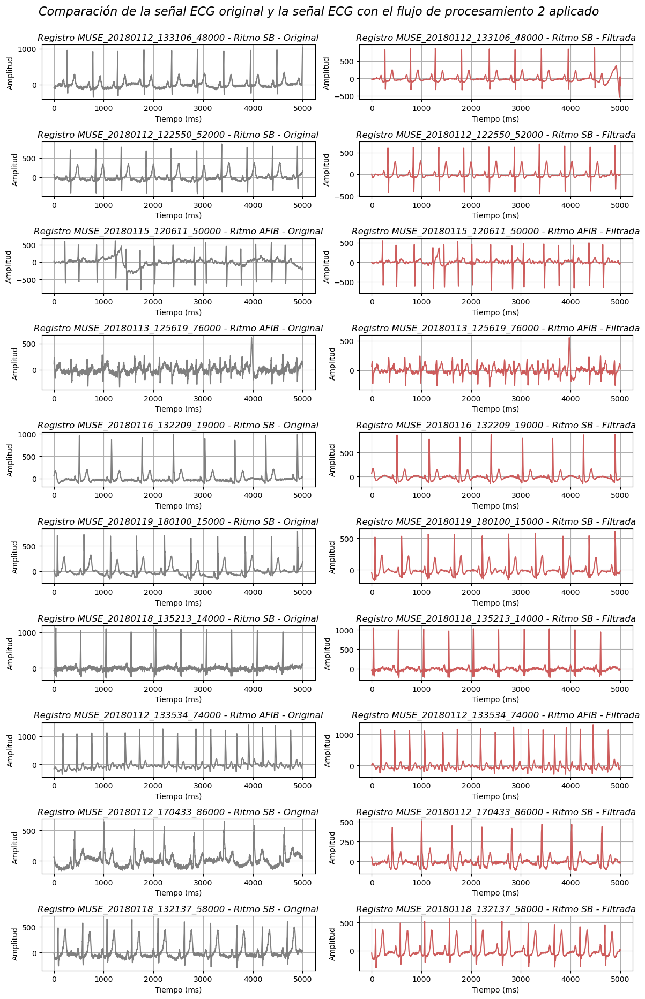

In [56]:
fig, axs = plt.subplots(10, 2, figsize=(12, 20))
fig.suptitle('Comparación de la señal ECG original y la señal ECG con el flujo de procesamiento 2 aplicado', fontsize=16, fontstyle='italic')

# Frecuencia de muestreo
fs = 500  # en Hz

# Contador para asignar cada gráfico a un subplot
contador = 0

# Recorrer los registros aleatorios
for i in data_AFIB_SB_name_aleatoria:
    # Verifica si el contador es menor al número total de subplots (10 registros)
    if contador >= 20:
        break

    # Obtiene la señal de ECG del registro
    if i in data_SB_name:
        valor = df_resultado_aleatorio.loc[i, 'II']  # Obtiene los valores de 'II' del registro
    elif i in data_AFIB_name:
        valor = df_resultado_aleatorio.loc[i, 'II']
    else:
        continue

    # Aplicar filtros a la señal
    valor_filtrado = filtro_pasa_altas(valor, fs)
    valor_filtrado = wavelet_filter(valor_filtrado, 'db3', level=2)
    valor_filtrado = filtro_pasa_bajas(valor_filtrado, fs)


    fila = contador
    columna_original = 0
    columna_filtrada = 1

    axs[fila, columna_original].plot(valor, 'gray')  # Usamos 'gray' para la señal original
    axs[fila, columna_original].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Original', fontstyle='italic')
    axs[fila, columna_original].set_xlabel('Tiempo (ms)')
    axs[fila, columna_original].set_ylabel('Amplitud')
    axs[fila, columna_original].grid(True)


    axs[fila, columna_filtrada].plot(valor_filtrado, 'indianred')  # Usamos 'indianred' para la señal filtrada
    axs[fila, columna_filtrada].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Filtrada', fontstyle='italic')
    axs[fila, columna_filtrada].set_xlabel('Tiempo (ms)')
    axs[fila, columna_filtrada].set_ylabel('Amplitud')
    axs[fila, columna_filtrada].grid(True)

    contador += 1

plt.tight_layout(rect=[0, 0.05, 1, 0.98])

plt.show()

**Flujo de procesamiento 2**


1. Detrend (eliminar tendencia): El objetivo de este paso es eliminar la tendencia de baja frecuencia de la señal, que puede aparecer como una deriva lenta debido al movimiento o al "baseline wander" (desplazamiento de la línea base). Este proceso reemplaza el filtro pasa-altas utilizado previamente para remover esta tendencia.

2. Filtro wavelet modificado: Aplicamos el filtro wavelet para suavizar la señal y reducir el ruido de alta frecuencia, manteniendo las características importantes de la señal ECG.

3. Filtro pasa-bajas a 50 Hz (IIR): Finalmente, aplicamos un filtro pasa-bajas a 50 Hz para eliminar el ruido de interferencia eléctrica, manteniendo las frecuencias de interés.

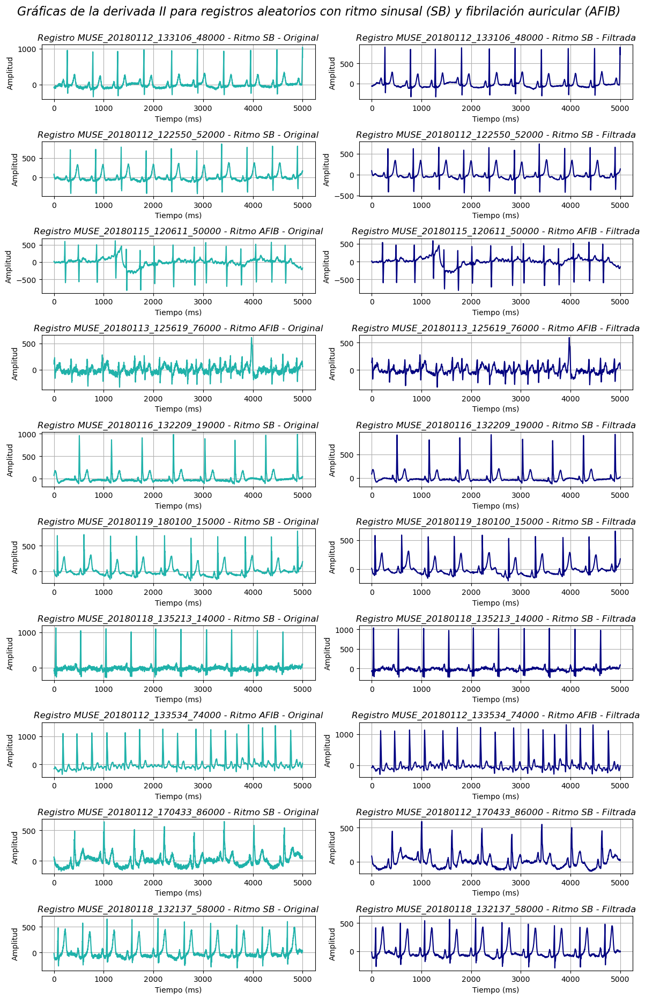

In [57]:
fig, axs = plt.subplots(10, 2, figsize=(12, 20))
fig.suptitle('Gráficas de la derivada II para registros aleatorios con ritmo sinusal (SB) y fibrilación auricular (AFIB)', fontsize=16, fontstyle='italic')

# Frecuencia de muestreo
fs = 500  # en Hz

# Contador para asignar cada gráfico a un subplot
contador = 0

# Recorrer los registros aleatorios
for i in data_AFIB_SB_name_aleatoria:
    # Verifica si el contador es menor al número total de subplots (10 registros)
    if contador >= 20:
        break

    # Obtiene la señal de ECG del registro
    if i in data_SB_name:
        valor = df_resultado_aleatorio.loc[i, 'II']  # Obtiene los valores de 'II' del registro
    elif i in data_AFIB_name:
        valor = df_resultado_aleatorio.loc[i, 'II']
    else:
        continue

    # Paso 1: Eliminar tendencia (detrend)
    valor_detrended = signal.detrend(valor)
    # Paso 2: Aplicar filtro wavelet modificado
    valor_wavelet = wavelet_filter(valor_detrended, 'db3', level=2)
    # Paso 3: Aplicar filtro pasa-bajas a 50 Hz
    valor_filtrado = filtro_pasa_bajas(valor_wavelet, fs)

    fila = contador
    columna_original = 0
    columna_filtrada = 1

    axs[fila, columna_original].plot(valor, 'lightseagreen')  # Usamos 'gray' para la señal original
    axs[fila, columna_original].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Original', fontstyle='italic')
    axs[fila, columna_original].set_xlabel('Tiempo (ms)')
    axs[fila, columna_original].set_ylabel('Amplitud')
    axs[fila, columna_original].grid(True)


    axs[fila, columna_filtrada].plot(valor_filtrado, 'navy')  # Usamos 'indianred' para la señal filtrada
    axs[fila, columna_filtrada].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Filtrada', fontstyle='italic')
    axs[fila, columna_filtrada].set_xlabel('Tiempo (ms)')
    axs[fila, columna_filtrada].set_ylabel('Amplitud')
    axs[fila, columna_filtrada].grid(True)

    contador += 1

plt.tight_layout(rect=[0, 0.05, 1, 0.98])

plt.show()

***c) Flujo de procesamiento 3.***

1. Filtro pasa-altas a 0.5 Hz (IIR):
Frecuencia de corte (0.5 Hz): Esta frecuencia de corte permite reducir el desplazamiento de la línea base, causado por movimientos o fluctuaciones de baja frecuencia (menores a 0.5 Hz), sin afectar las componentes relevantes del ECG, que suelen encontrarse en frecuencias más altas.
Tipo de filtro (IIR Butterworth): Elegir un filtro IIR es adecuado aquí, ya que ofrece una transición más pronunciada y se ajusta bien a las aplicaciones en tiempo real. El filtro Butterworth en particular tiene una respuesta en frecuencia suave, lo cual minimiza la distorsión en la forma de la onda ECG.

2. Filtro pasa-bajas a 50 Hz (IIR):
Frecuencia de corte (50 Hz): Esta frecuencia de corte elimina el ruido de alta frecuencia, como la interferencia eléctrica de 50 Hz, sin afectar las señales cardíacas principales, que se encuentran en frecuencias más bajas.
Tipo de filtro (IIR Butterworth): El filtro IIR también es adecuado para esta etapa debido a su eficiencia computacional y su transición suave en la frecuencia de corte. Elegir un filtro Butterworth asegura que se minimice la distorsión, manteniendo la integridad de la señal ECG en el rango de frecuencias de interés.

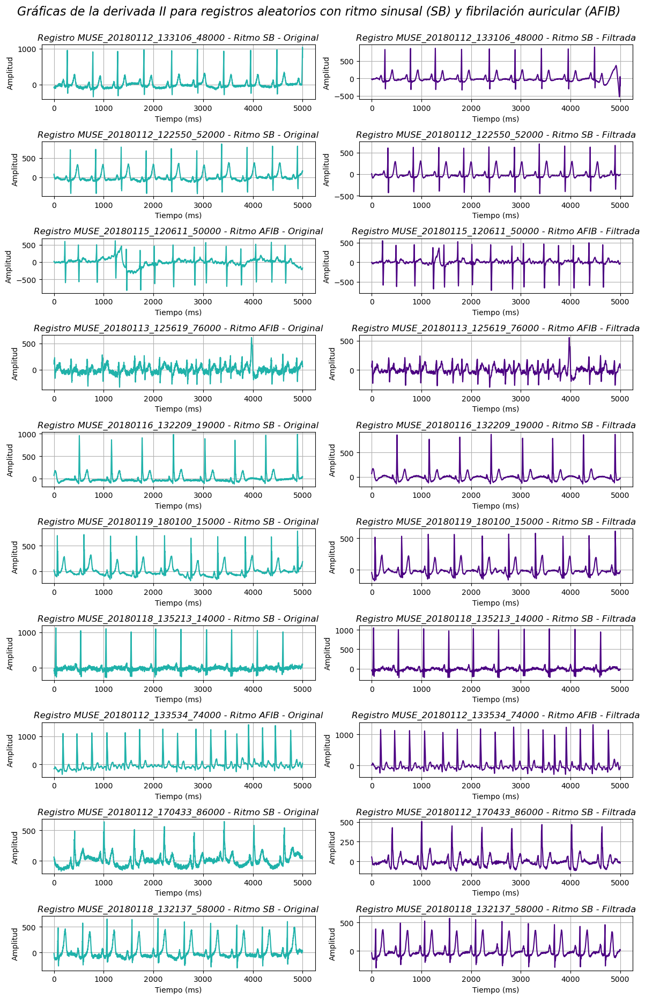

In [58]:
# Crear una figura con un arreglo de subplots de 10 filas y 2 columnas
fig, axs = plt.subplots(10, 2, figsize=(12, 20))
fig.suptitle('Gráficas de la derivada II para registros aleatorios con ritmo sinusal (SB) y fibrilación auricular (AFIB)', fontsize=16, fontstyle='italic')

# Frecuencia de muestreo
fs = 500  # en Hz

# Contador para asignar cada gráfico a un subplot
contador = 0

# Recorrer los registros aleatorios
for i in data_AFIB_SB_name_aleatoria:
    # Verifica si el contador es menor al número total de subplots (10 registros)
    if contador >= 20:
        break

    # Obtiene la señal de ECG del registro
    if i in data_SB_name:
        valor = df_resultado_aleatorio.loc[i, 'II']  # Obtiene los valores de 'II' del registro
    elif i in data_AFIB_name:
        valor = df_resultado_aleatorio.loc[i, 'II']
    else:
        continue

    valor_filtrado = filtro_pasa_altas(valor, fs)
    valor_filtrado = filtro_pasa_bajas(valor_filtrado, fs)

    fila = contador
    columna_original = 0
    columna_filtrada = 1

    axs[fila, columna_original].plot(valor, 'lightseagreen')  # Usamos 'gray' para la señal original
    axs[fila, columna_original].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Original', fontstyle='italic')
    axs[fila, columna_original].set_xlabel('Tiempo (ms)')
    axs[fila, columna_original].set_ylabel('Amplitud')
    axs[fila, columna_original].grid(True)


    axs[fila, columna_filtrada].plot(valor_filtrado, 'indigo')  # Usamos 'indianred' para la señal filtrada
    axs[fila, columna_filtrada].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Filtrada', fontstyle='italic')
    axs[fila, columna_filtrada].set_xlabel('Tiempo (ms)')
    axs[fila, columna_filtrada].set_ylabel('Amplitud')
    axs[fila, columna_filtrada].grid(True)

    contador += 1

plt.tight_layout(rect=[0, 0.05, 1, 0.98])

plt.show()

## ***Cargado de las señales ECG filtradas***

Con propósitos de comparación para saber qué flujo de procesamiento es el más adecuado, se cargarán las señales ECG previamente filtradas del dataset empleadas en el proyecto 2 para la extracción de características.

In [59]:
#sb_folder = '/content/drive/My Drive/Proyecto 3/SB'
#afib_folder = '/content/drive/My Drive/Proyecto 3/AFIB'
sb_folder = path + '/SB'
afib_folder = path + '/AFIB'

In [60]:
sb_files = os.listdir(sb_folder)
afib_files = os.listdir(afib_folder)
sb_files = [file.replace('.csv', '') for file in sb_files if file.endswith('.csv')]
afib_files = [file.replace('.csv', '') for file in afib_files if file.endswith('.csv')]

subjects_sb = [file + '.csv' for file in sb_files if file in df_rsal['Registro Aleatorio'].values]
subjects_afib = [file + '.csv' for file in afib_files if file in df_rsal['Registro Aleatorio'].values]

In [61]:
# 5. Crear listas para almacenar los resultados
records = []  # Para los nombres de los sujetos (Registros)
states = []   # Para los estados (SB o AFIB)
ecgs = []     # Para las señales ECG (de la derivación II)

# 6. Procesar los archivos de la carpeta SB
for sb_file in subjects_sb:
    sb_file_path = os.path.join(sb_folder, sb_file)
    df_sb = pd.read_csv(sb_file_path, header=None)  # Leer sin cabecera

    # Extraer la señal ECG de la primera columna (suponemos que es la derivación II)
    ecg_signal = df_sb.iloc[:, 0].tolist()  # Primera columna

    # Agregar los datos a las listas
    records.append(sb_file.replace('.csv', ''))  # Nombre del archivo sin '.csv'
    states.append('SB')  # El estado es 'SB' porque está en la carpeta SB
    ecgs.append(ecg_signal)

# 7. Procesar los archivos de la carpeta AFIB
for afib_file in subjects_afib:
    afib_file_path = os.path.join(afib_folder, afib_file)
    df_afib = pd.read_csv(afib_file_path, header=None)  # Leer sin cabecera

    # Extraer la señal ECG de la primera columna (suponemos que es la derivación II)
    ecg_signal = df_afib.iloc[:, 0].tolist()  # Primera columna

    # Agregar los datos a las listas
    records.append(afib_file.replace('.csv', ''))  # Nombre del archivo sin '.csv'
    states.append('AFIB')  # El estado es 'AFIB' porque está en la carpeta AFIB
    ecgs.append(ecg_signal)

# 8. Crear un DataFrame con los datos
df_ecg = pd.DataFrame({
    'Registro': records,
    'Estado': states,
    'ECG denoised': ecgs
})


In [62]:
df_ecg

,Registro,Estado,ECG denoised
0,MUSE_20180112_122550_52000,SB,"[77.635, 66.971, 57.484, 49.644, 43.114, 37.02..."
1,MUSE_20180112_133106_48000,SB,"[-7.3828, -4.8231, -2.6564, -1.3926, -1.6199, ..."
2,MUSE_20180112_170433_86000,SB,"[101.65, 99.072, 96.224, 92.883, 89.061, 84.92..."
3,MUSE_20180116_132209_19000,SB,"[121.25, 127.55, 133.16, 137.84, 141.92, 146.1..."
4,MUSE_20180118_132137_58000,SB,"[126.63, 116.81, 107.41, 98.441, 89.46, 79.789..."
5,MUSE_20180118_135213_14000,SB,"[9.8414, 8.4107, 8.9912, 12.298, 18.108, 24.99..."
6,MUSE_20180119_180100_15000,SB,"[106.42, 99.381, 92.783, 86.902, 81.789, 77.40..."
7,MUSE_20180112_133534_74000,AFIB,"[-2.7959, -2.1795, -1.5865, -1.0713, -0.69061,..."
8,MUSE_20180113_125619_76000,AFIB,"[-9.6325, 10.589, 27.321, 38.788, 45.235, 48.5..."
9,MUSE_20180115_120611_50000,AFIB,"[26.476, 27.139, 27.786, 28.239, 28.167, 27.11..."


In [63]:
# Si 'Registro' es el índice en df_resultado_aleatorio, lo reseteamos
df_resultado_aleatorio = df_resultado_aleatorio.reset_index()

# Ahora realizamos el merge entre df_ecg y df_resultado_aleatorio usando la columna 'Registro'
df_final = df_ecg.merge(df_resultado_aleatorio[['Registro', 'II']], on='Registro', how='inner')

df_final

,Registro,Estado,ECG denoised,II
0,MUSE_20180112_122550_52000,SB,"[77.635, 66.971, 57.484, 49.644, 43.114, 37.02...","[78.08, 58.56, 48.8, 43.92, 43.92, 43.92, 29.2..."
1,MUSE_20180112_133106_48000,SB,"[-7.3828, -4.8231, -2.6564, -1.3926, -1.6199, ...","[-82.96, -82.96, -82.96, -73.2, -73.2, -68.32,..."
2,MUSE_20180112_170433_86000,SB,"[101.65, 99.072, 96.224, 92.883, 89.061, 84.92...","[63.44, 63.44, 53.68, 58.56, 48.8, 29.28, 39.0..."
3,MUSE_20180116_132209_19000,SB,"[121.25, 127.55, 133.16, 137.84, 141.92, 146.1...","[68.32, 78.08, 87.84, 87.84, 92.72, 87.84, 92...."
4,MUSE_20180118_132137_58000,SB,"[126.63, 116.81, 107.41, 98.441, 89.46, 79.789...","[-14.64, -29.28, -39.04, -43.92, -43.92, -53.6..."
5,MUSE_20180118_135213_14000,SB,"[9.8414, 8.4107, 8.9912, 12.298, 18.108, 24.99...","[-73.2, -63.44, -78.08, -82.96, -63.44, -63.44..."
6,MUSE_20180119_180100_15000,SB,"[106.42, 99.381, 92.783, 86.902, 81.789, 77.40...","[24.4, 9.76, 9.76, 9.76, 4.88, 0.0, -4.88, -4...."
7,MUSE_20180112_133534_74000,AFIB,"[-2.7959, -2.1795, -1.5865, -1.0713, -0.69061,...","[-156.16, -156.16, -156.16, -156.16, -156.16, ..."
8,MUSE_20180113_125619_76000,AFIB,"[-9.6325, 10.589, 27.321, 38.788, 45.235, 48.5...","[107.36, 126.88, 175.68, 161.04, 151.28, 146.4..."
9,MUSE_20180115_120611_50000,AFIB,"[26.476, 27.139, 27.786, 28.239, 28.167, 27.11...","[19.52, 19.52, 19.52, 19.52, 19.52, 19.52, 19...."


Ahora realizamos la comparación de los 3 flujos de procesamiento para cada sujeto.

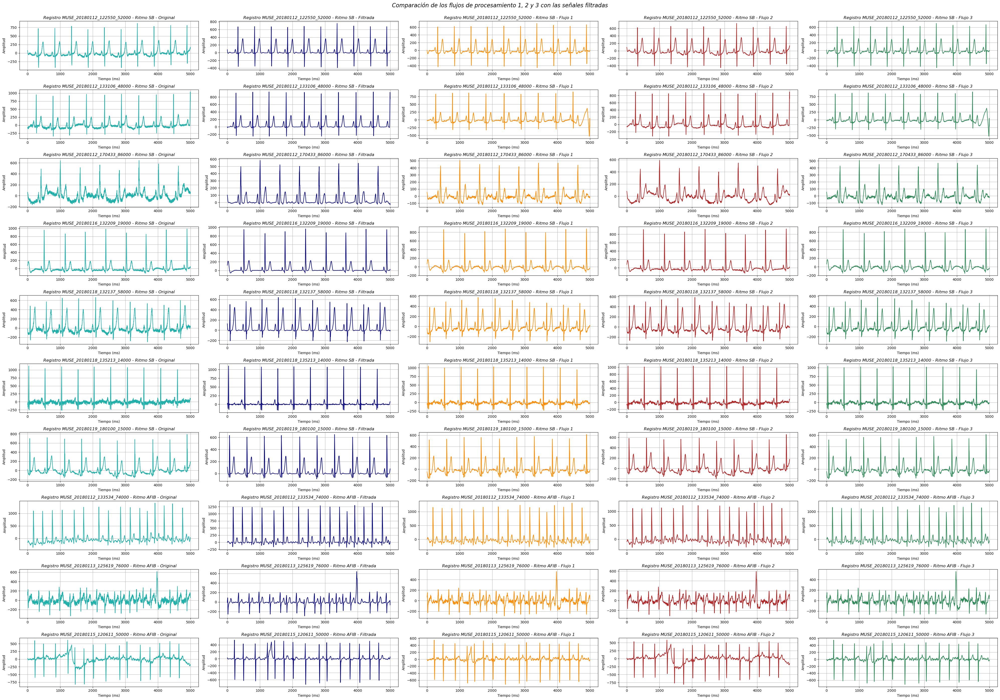

In [64]:
fig, axs = plt.subplots(10, 5, figsize=(40, 30))
fig.suptitle('Comparación de los flujos de procesamiento 1, 2 y 3 con las señales filtradas', fontsize=16, fontstyle='italic')

# Frecuencia de muestreo
fs = 500  # en Hz

contador = 0

for i in df_final['Registro'].values:
    if contador >= 50:
        break
    if i in df_final[df_final['Estado'] == 'AFIB']['Registro'].values:
        senal_cruda = df_final.loc[df_final['Registro'] == i, 'II'].values[0]  # .values[0] para obtener el valor de la serie
        senal_filtrada = df_final.loc[df_final['Registro'] == i, 'ECG denoised'].values[0]  # .values[0] para obtener el valor de la serie
    elif i in df_final[df_final['Estado'] == 'SB']['Registro'].values:
        senal_cruda = df_final.loc[df_final['Registro'] == i, 'II'].values[0]  # .values[0] para obtener el valor de la serie
        senal_filtrada = df_final.loc[df_final['Registro'] == i, 'ECG denoised'].values[0]  # .values[0] para obtener el valor de la serie
    else:
        continue

    #Se aplica el flujo 1
    senal_h = filtro_pasa_altas(senal_cruda, fs)
    senal_w = wavelet_filter(senal_h, 'db3', level=2)
    senal_f1 = filtro_pasa_bajas(senal_w, fs)

    # Se aplica el flujo 2
    senal_detrended = signal.detrend(senal_cruda)
    senal_w2 = wavelet_filter(senal_detrended, 'db3', level=2)
    senal_f2 = filtro_pasa_bajas(senal_w2, fs)
    
    #Se aplica el flujo 3
    senal_h2 = filtro_pasa_altas(senal_cruda, fs)
    senal_f3 = filtro_pasa_bajas(senal_h2, fs)

    fila = contador
    columna_original = 0
    columna_filtrada = 1
    columna_flujo1 = 2
    columna_flujo2 = 3
    columna_flujo3 = 4

    axs[fila, columna_original].plot(senal_cruda, 'lightseagreen')
    axs[fila, columna_original].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Original', fontstyle='italic')
    axs[fila, columna_original].set_xlabel('Tiempo (ms)')
    axs[fila, columna_original].set_ylabel('Amplitud')
    axs[fila, columna_original].grid(True)


    axs[fila, columna_filtrada].plot(senal_filtrada, 'navy')
    axs[fila, columna_filtrada].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Filtrada', fontstyle='italic')
    axs[fila, columna_filtrada].set_xlabel('Tiempo (ms)')
    axs[fila, columna_filtrada].set_ylabel('Amplitud')
    axs[fila, columna_filtrada].grid(True)

    axs[fila, columna_flujo1].plot(senal_f1, 'darkorange')
    axs[fila, columna_flujo1].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Flujo 1', fontstyle='italic')
    axs[fila, columna_flujo1].set_xlabel('Tiempo (ms)')
    axs[fila, columna_flujo1].set_ylabel('Amplitud')
    axs[fila, columna_flujo1].grid(True)

    axs[fila, columna_flujo2].plot(senal_f2, 'firebrick')
    axs[fila, columna_flujo2].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Flujo 2', fontstyle='italic')
    axs[fila, columna_flujo2].set_xlabel('Tiempo (ms)')
    axs[fila, columna_flujo2].set_ylabel('Amplitud')
    axs[fila, columna_flujo2].grid(True)

    axs[fila, columna_flujo3].plot(senal_f3, 'seagreen')
    axs[fila, columna_flujo3].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Flujo 3', fontstyle='italic')
    axs[fila, columna_flujo3].set_xlabel('Tiempo (ms)')
    axs[fila, columna_flujo3].set_ylabel('Amplitud')
    axs[fila, columna_flujo3].grid(True)

    contador += 1

plt.tight_layout(rect=[0, 0.05, 1, 0.98])

plt.show()

Asimismo, se genera el periodograma de Welch para comparar los tres flujos de procesamiento en cada sujeto y evaluar qué proceso de filtrado es el más adecuado.

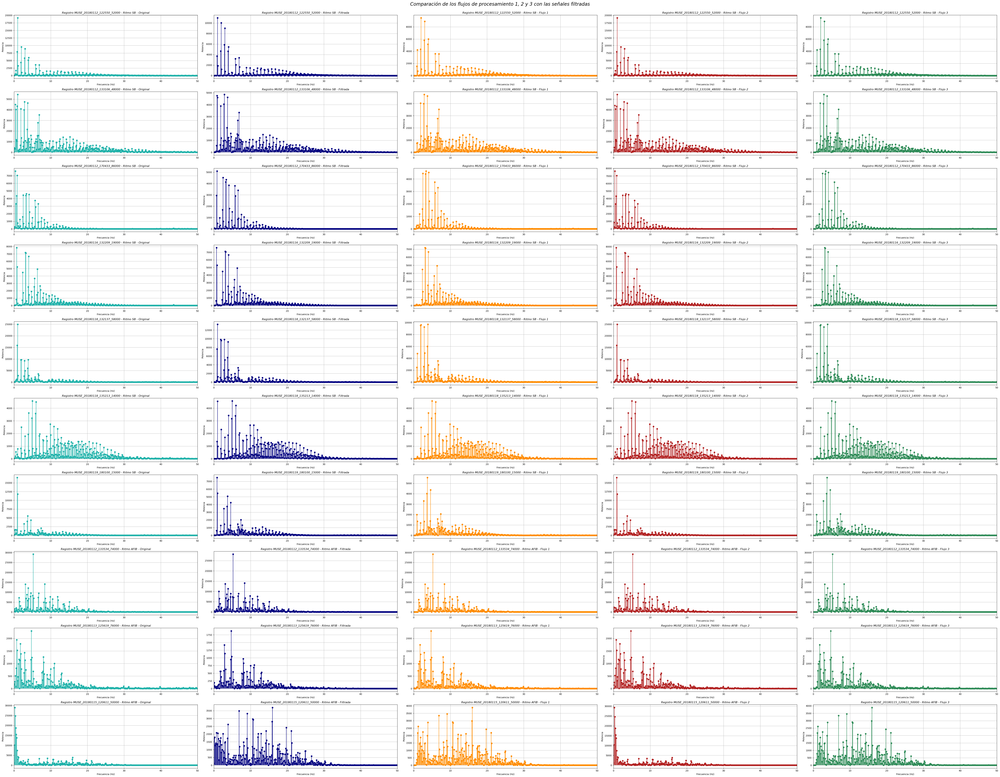

In [65]:
def graficar_periodograma(senal, fs=500, nperseg=4000):
    noverlap = nperseg // 2  # Solapamiento del 50%
    ventana = np.hanning(nperseg)  # Ventana Hanning

    # Se calcula el periodograma de Welch
    f, pxx = welch(senal, fs, window=ventana, nperseg=nperseg, noverlap=noverlap)

    # Se filtra para mostrar solo hasta 50 Hz
    f = f[f <= 50]  # Solo frecuencias menores o iguales a 50 Hz
    pxx = pxx[:len(f)]  # Se filtra la potencia asociada

    return f, pxx


fig, axs = plt.subplots(10, 5, figsize=(60, 50))
fig.suptitle('Comparación de los flujos de procesamiento 1, 2 y 3 con las señales filtradas', fontsize=20, fontstyle='italic')

# Frecuencia de muestreo
fs = 500

contador = 0

for i in df_final['Registro'].values:
    if contador >= 50:
        break
    if i in df_final[df_final['Estado'] == 'AFIB']['Registro'].values:
        senal_cruda = df_final.loc[df_final['Registro'] == i, 'II'].values[0]  # .values[0] para obtener el valor de la serie
        senal_filtrada = df_final.loc[df_final['Registro'] == i, 'ECG denoised'].values[0]  # .values[0] para obtener el valor de la serie
    elif i in df_final[df_final['Estado'] == 'SB']['Registro'].values:
        senal_cruda = df_final.loc[df_final['Registro'] == i, 'II'].values[0]  # .values[0] para obtener el valor de la serie
        senal_filtrada = df_final.loc[df_final['Registro'] == i, 'ECG denoised'].values[0]  # .values[0] para obtener el valor de la serie
    else:
        continue

    # Se aplica el flujo 1
    senal_h = filtro_pasa_altas(senal_cruda, fs)
    senal_w = wavelet_filter(senal_h, 'db3', level=2)
    senal_f1 = filtro_pasa_bajas(senal_w, fs)

    # Se aplica el flujo 2
    senal_detrended = detrend(senal_cruda)
    senal_w2 = wavelet_filter(senal_detrended, 'db3', level=2)
    senal_f2 = filtro_pasa_bajas(senal_w2, fs)

    # Se aplica el flujo 3
    senal_h2 = filtro_pasa_altas(senal_cruda, fs)
    senal_f3 = filtro_pasa_bajas(senal_h2, fs)

    fila = contador
    columna_original = 0
    columna_filtrada = 1
    columna_flujo1 = 2
    columna_flujo2 = 3
    columna_flujo3 = 4

    # Se grafica el periodograma de Welch para las señales

    # Para la señal original
    f, pxx = graficar_periodograma(senal_cruda, fs)
    axs[fila][columna_original].stem(f, pxx, linefmt='lightseagreen', basefmt=" ")
    axs[fila][columna_original].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Original', fontstyle='italic')
    axs[fila][columna_original].set_xlabel('Frecuencia (Hz)')
    axs[fila][columna_original].set_ylabel('Potencia')
    axs[fila][columna_original].grid(True)
    axs[fila][columna_original].set_xlim([0, 50])

    # Para la señal filtrada
    f, pxx = graficar_periodograma(senal_filtrada, fs)
    axs[fila][columna_filtrada].stem(f, pxx, linefmt='navy', basefmt=" ")
    axs[fila][columna_filtrada].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Filtrada', fontstyle='italic')
    axs[fila][columna_filtrada].set_xlabel('Frecuencia (Hz)')
    axs[fila][columna_filtrada].set_ylabel('Potencia')
    axs[fila][columna_filtrada].grid(True)
    axs[fila][columna_filtrada].set_xlim([0, 50])

    # Para el flujo 1
    f, pxx = graficar_periodograma(senal_f1, fs)
    axs[fila][columna_flujo1].stem(f, pxx, linefmt='darkorange', basefmt=" ")
    axs[fila][columna_flujo1].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Flujo 1', fontstyle='italic')
    axs[fila][columna_flujo1].set_xlabel('Frecuencia (Hz)')
    axs[fila][columna_flujo1].set_ylabel('Potencia')
    axs[fila][columna_flujo1].grid(True)
    axs[fila][columna_flujo1].set_xlim([0, 50])

    # Para el flujo 2
    f, pxx = graficar_periodograma(senal_f2, fs)
    axs[fila][columna_flujo2].stem(f, pxx, linefmt='firebrick', basefmt=" ")
    axs[fila][columna_flujo2].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Flujo 2', fontstyle='italic')
    axs[fila][columna_flujo2].set_xlabel('Frecuencia (Hz)')
    axs[fila][columna_flujo2].set_ylabel('Potencia')
    axs[fila][columna_flujo2].grid(True)
    axs[fila][columna_flujo2].set_xlim([0, 50])

    # Para el flujo 3
    f, pxx = graficar_periodograma(senal_f3, fs)
    axs[fila][columna_flujo3].stem(f, pxx, linefmt='seagreen', basefmt=" ")
    axs[fila][columna_flujo3].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Flujo 3', fontstyle='italic')
    axs[fila][columna_flujo3].set_xlabel('Frecuencia (Hz)')
    axs[fila][columna_flujo3].set_ylabel('Potencia')
    axs[fila][columna_flujo3].grid(True)
    axs[fila][columna_flujo3].set_xlim([0, 50])

    contador += 1


plt.subplots_adjust(hspace=1.0, wspace=0.5)


plt.tight_layout(rect=[0, 0.05, 1, 0.98])

plt.show()


# ***4.4. Aplicación del flujo de procesamiento y el procesamiento de normalización a las señales de la carpeta ECGData (señales sin tratamientos previos)***

Una vez seleccionado el flujo de procesamiento, se cargarán los registros con las señales extraídas de la derivación II. Posteriormente, se aplicará el flujo de procesamiento a todas las señales ECG. Por ahora, se aplicará a las 10 señales seleccionadas de forma aleatoria.

In [66]:
def filtrado(signal, fs):
    signal_h = filtro_pasa_altas(signal, fs)
    signal_w = wavelet_filter(signal_h, 'db3', level=2)
    signal_result = filtro_pasa_bajas(signal_w, fs)
    return signal_result

In [67]:
def preprocess(señal):
    detrend1 = detrend(señal)
    compression = compress(detrend1)
    detrend2 = detrend(compression)
    return detrend2

In [68]:
def compress(signal):
    x_min = signal.min()
    x_max = signal.max()
    num = (signal) - (x_min)
    den = x_max - x_min
    compression = num/den
    return compression

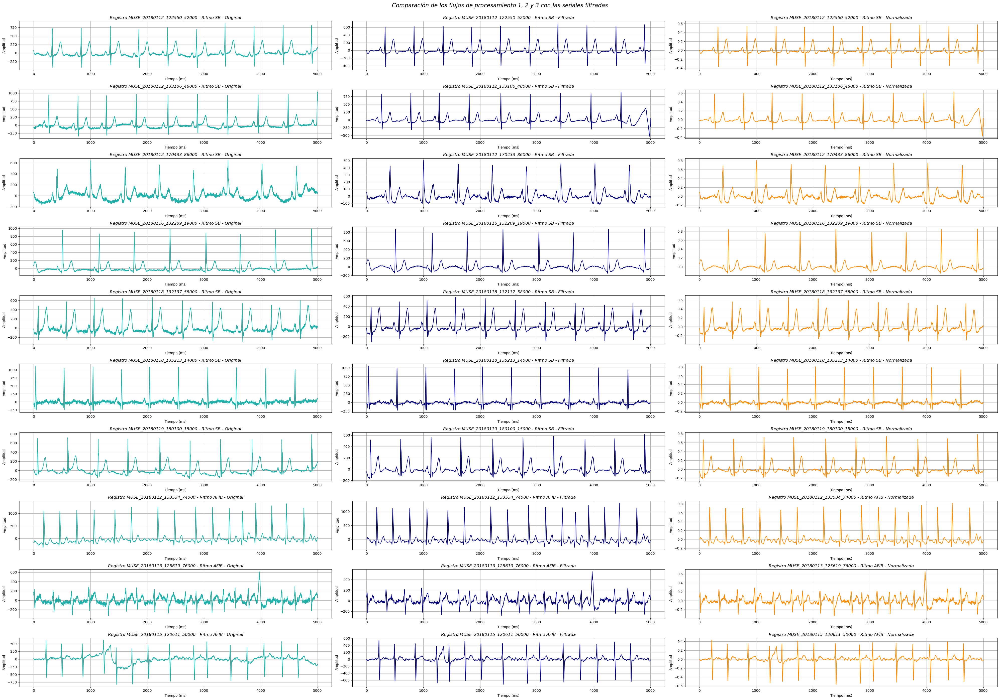

In [69]:
fig, axs = plt.subplots(10, 3, figsize=(40, 30))
fig.suptitle('Comparación de los flujos de procesamiento 1, 2 y 3 con las señales filtradas', fontsize=16, fontstyle='italic')

# Frecuencia de muestreo
fs = 500  # en Hz
contador = 0

for i in df_final['Registro'].values:
    if contador >= 30:
        break
    if i in df_final[df_final['Estado'] == 'AFIB']['Registro'].values:
        senal_cruda = df_final.loc[df_final['Registro'] == i, 'II'].values[0]  # .values[0] para obtener el valor de la serie
    elif i in df_final[df_final['Estado'] == 'SB']['Registro'].values:
        senal_cruda = df_final.loc[df_final['Registro'] == i, 'II'].values[0]  # .values[0] para obtener el valor de la serie
    else:
        continue

    #Se aplica el flujo de procesamiento
    senal_h = filtro_pasa_altas(senal_cruda, fs)
    senal_w = wavelet_filter(senal_h, 'db3', level=2)
    senal_f1 = filtro_pasa_bajas(senal_w, fs)

    # Se aplica el proceso de normalización
    senal_preprocess = preprocess(senal_f1)

    fila = contador
    columna_original = 0
    columna_filtrada = 1
    columna_normalizada = 2
   
    axs[fila, columna_original].plot(senal_cruda, 'lightseagreen')
    axs[fila, columna_original].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Original', fontstyle='italic')
    axs[fila, columna_original].set_xlabel('Tiempo (ms)')
    axs[fila, columna_original].set_ylabel('Amplitud')
    axs[fila, columna_original].grid(True)


    axs[fila, columna_filtrada].plot(senal_f1, 'navy')
    axs[fila, columna_filtrada].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Filtrada', fontstyle='italic')
    axs[fila, columna_filtrada].set_xlabel('Tiempo (ms)')
    axs[fila, columna_filtrada].set_ylabel('Amplitud')
    axs[fila, columna_filtrada].grid(True)

    axs[fila, columna_flujo1].plot(senal_preprocess, 'darkorange')
    axs[fila, columna_flujo1].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"} - Normalizada', fontstyle='italic')
    axs[fila, columna_flujo1].set_xlabel('Tiempo (ms)')
    axs[fila, columna_flujo1].set_ylabel('Amplitud')
    axs[fila, columna_flujo1].grid(True)

    contador += 1

plt.tight_layout(rect=[0, 0.05, 1, 0.98])

plt.show()


"El análisis de las señales electrocardiográficas posterior a la aplicación del flujo de procesamiento revela una notable mejora en la calidad general de la señal. Esta optimización se logra mediante la eliminación efectiva de ruidos de alta y baja frecuencia, lo cual es fundamental para un análisis más preciso. Sin este proceso de filtrado, la identificación de componentes críticos como las ondas P, T y los complejos QRS resultaría significativamente más compleja.

La implementación específica de filtros pasa altas a 0.5 Hz y pasa bajas a 50 Hz demuestra ser particularmente efectiva en dos aspectos: la eliminación de la deriva de la línea base y la supresión del ruido proveniente de la red eléctrica. Adicionalmente, esta depuración inicial de la señal potencia la eficacia de procesamientos posteriores, como la función detrend, que opera de manera más eficiente sobre una señal previamente acondicionada.

Desde una perspectiva clínica, la importancia de este procesamiento radica en su capacidad para generar señales más confiables y representativas de la actividad cardíaca real. Esta mejora en la calidad de la señal facilita la detección precisa de irregularidades en el ECG, constituyendo una herramienta más robusta para el diagnóstico mdico."

# ***5. Extracción de la frecuencia con máxima potencia (fMP) utilizando el periodograma de Welch***

In [70]:
#Después de seleccionar el flujo de procesamiento, lo que haríamos sería crear la función para aplicar el flujo de procesamiento, se utiliza la función de procesamiento de señales del proyecto 2, función para extraer la fMP con Welch. Finalmente se crea una rutina con
#Todas las funciones. Cargamos el csv donde teníamos el fMP de las señales del proyecto 2, la unimos a este dataframe y se hace análisis estadístico.

Ahora, se extrae la frecuencia de máxima potencia para las 10 señales ECG seleccionadas de manera aleatoria. 

In [71]:
def frecuencia_max_potencia(signal, fs):
    nperseg = 1024
    noverlap = int(nperseg / 2)
    ventana = np.hanning(nperseg)
    f, power = welch(signal, fs, window=ventana, nperseg=nperseg, noverlap=noverlap)
    frecuencia_maxima_potencia = f[np.argmax(power)]

    return f, power, frecuencia_maxima_potencia

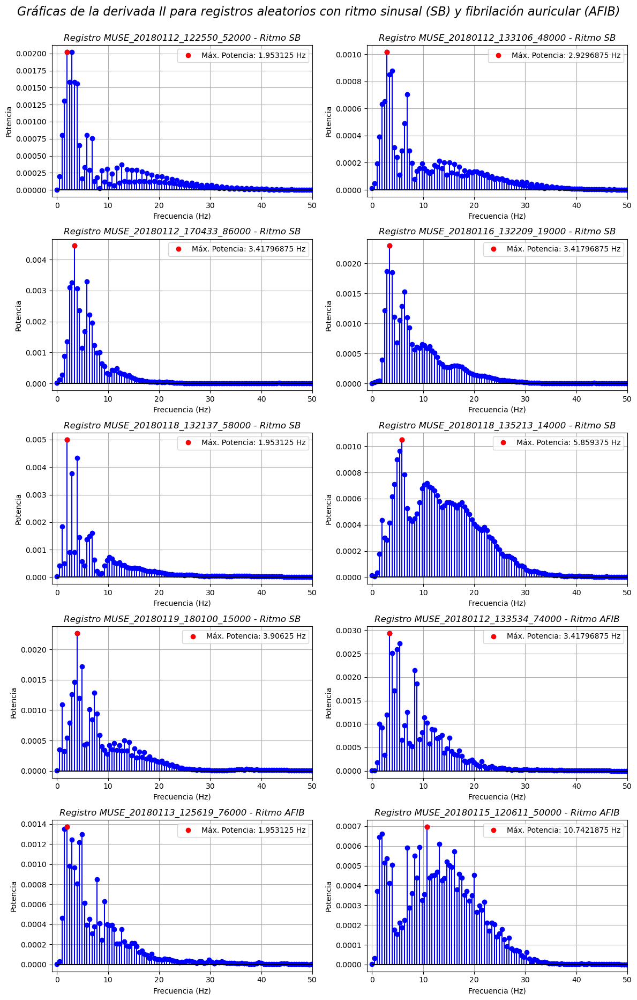

In [72]:
import matplotlib.pyplot as plt
import numpy as np

# Creación de la figura con 5 filas y 2 columnas
fig, axs = plt.subplots(5, 2, figsize=(12, 20))
fig.suptitle('Gráficas de la derivada II para registros aleatorios con ritmo sinusal (SB) y fibrilación auricular (AFIB)', 
             fontsize=16, fontstyle='italic')

fs = 500  # Frecuencia de muestreo en Hz
contador = 0  # Para controlar el número de registros procesados

# Recorrer los registros de la columna 'Registro' de tu DataFrame
for i in df_final['Registro'].values:
    if contador >= 10:  # Limitar a un máximo de 10 gráficos (5 filas * 2 columnas)
        break

    # Verificar si el registro tiene el estado 'AFIB' o 'SB'
    if i in df_final[df_final['Estado'] == 'AFIB']['Registro'].values:
        senal_cruda = df_final.loc[df_final['Registro'] == i, 'II'].values[0]  # .values[0] para obtener la serie
    elif i in df_final[df_final['Estado'] == 'SB']['Registro'].values:
        senal_cruda = df_final.loc[df_final['Registro'] == i, 'II'].values[0]
    else:
        continue

    # Aplicar el flujo de procesamiento a la señal
    senal_h = filtro_pasa_altas(senal_cruda, fs)
    senal_w = wavelet_filter(senal_h, 'db3', level=2)
    senal_f1 = filtro_pasa_bajas(senal_w, fs)

    # Normalizar la señal
    senal_preprocess = preprocess(senal_f1)

    # Obtener el periodograma o análisis de frecuencia
    f, power, fMP = frecuencia_max_potencia(senal_preprocess, fs)

    # Determinar la fila y columna para colocar el gráfico
    fila = contador // 2  # División entera para filas (5 filas en total)
    columna = contador % 2  # Módulo para alternar entre las 2 columnas

    axs[fila, columna].stem(f, power, linefmt='b-', markerfmt='bo', basefmt='k-')  # Graficamos el periodograma
    axs[fila, columna].set_title(f'Registro {i} - {"Ritmo SB" if i in data_SB_name else "Ritmo AFIB"}', fontstyle='italic')
    axs[fila, columna].set_xlabel('Frecuencia (Hz)')
    axs[fila, columna].set_ylabel('Potencia')
    axs[fila, columna].set_xlim(-1,50)
    axs[fila, columna].grid(True)
    
    axs[fila, columna].plot(fMP, power[np.argmax(power)], 'ro', label=f'Máx. Potencia: {fMP} Hz')
    axs[fila, columna].legend()

    contador += 1
    
plt.tight_layout(rect=[0, 0.05, 1, 0.98])

plt.show()

# ***6. Rutina para el filtrado, procesamiento de normalización y extracción de la fMP de las señales ECG***

Previo a realizar la rutina, se cargarán todos los registros SB y AFIB sin filtrado.

In [73]:
# Montar Google Drive
#drive.mount('/content/drive')

# Ruta a la carpeta que deseas abrir
#folder_path = '/content/drive/My Drive/Proyecto 3/ECGData'

folder_path = path + '/ECGData'
files = os.listdir(folder_path)

In [74]:
dataAFIB_FileName_csv = [f"{archivo}.csv" for archivo in data_AFIB_name]
dataSB_FileName_csv = [f"{archivo}.csv" for archivo in data_SB_name]

In [75]:
SB_registers = []
AFIB_registers = []

for archivo in files:
    if archivo in dataSB_FileName_csv:
        SB_registers.append(archivo)
    elif archivo in dataAFIB_FileName_csv:
        AFIB_registers.append(archivo)
        

Se extrae la segunda derivación de los archivos para las señales ECG de los registros SB y AFIB.

In [76]:
# Lista vacía donde vamos a almacenar los resultados
list_SB_II = []
list_AFIB_II = []

# Iterar sobre los archivos CSV
for archivo in files:
    df = pd.read_csv(path + "/ECGData/"+ archivo)
    signal_ii = df['II']
    if archivo in SB_registers:
        list_SB_II.append({'Registro': archivo, 'II': signal_ii, 'Estado': 'SB'})
    elif archivo in AFIB_registers:
        list_AFIB_II.append({'Registro': archivo, 'II': signal_ii, 'Estado': 'AFIB'})  

df_f = pd.DataFrame(list_SB_II + list_AFIB_II)

In [77]:
df_f

,Registro,II,Estado
0,MUSE_20180111_155758_17000.csv,0 341.60 1 268.40 2 229.36 3...,SB
1,MUSE_20180111_155839_67000.csv,0 -29.28 1 -24.40 2 -34.16 3 ...,SB
2,MUSE_20180111_155859_36000.csv,0 -58.56 1 -58.56 2 -58.56 3...,SB
3,MUSE_20180111_155907_78000.csv,0 -87.84 1 -63.44 2 -43.92 3 ...,SB
4,MUSE_20180111_160033_11000.csv,0 4.88 1 -4.88 2 -9.76 3 ...,SB
...,...,...,...
5664,MUSE_20180712_161449_58000.csv,0 -68.32 1 -68.32 2 -68.32 3...,AFIB
5665,MUSE_20180712_161451_72000.csv,0 -29.28 1 -29.28 2 -29.28 3 ...,AFIB
5666,MUSE_20180712_161452_78000.csv,0 -39.04 1 -39.04 2 -39.04 3 ...,AFIB
5667,MUSE_20180712_161503_00000.csv,0 0.00 1 0.00 2 -4.88 3...,AFIB


Por cuestiones de facilidad para el tratamiento de las señales, se almacenarán en carpetas separadas según la arritmia, únicamente con la señal ECG correspondiente a la derivación II, que es a la que se le hará el proceso de filtrado. 

In [78]:
def guardar_archivos(df, carpeta): #Función para guardar los registros de la II derivación
    for _, row in df.iterrows():
        nombre_archivo = row['Registro']
        señal = row['II']
        ruta_guardar = os.path.join(carpeta, nombre_archivo)

        # Guardar la señal en un archivo .csv
        with open(ruta_guardar, 'w') as f:
            for dato in señal:
                f.write(f"{dato}\n")

In [79]:
sb_folder = "SB_noise"
afib_folder = "AFIB_noise"

df_SB = df_f[df_f['Estado'] == 'SB']
df_AFIB = df_f[df_f['Estado'] == 'AFIB']

if not os.path.exists(sb_folder):
    os.makedirs(sb_folder)
    print(f"Carpeta '{sb_folder}' creada.")
    guardar_archivos(df_SB, sb_folder)
    print('Archivos de SB guardados correctamente')
else:
    print(f"Carpeta '{sb_folder}' ya existe.")

if not os.path.exists(afib_folder):
    os.makedirs(afib_folder)
    print(f"Carpeta '{afib_folder}' creada.")
    guardar_archivos(df_AFIB, afib_folder)
    print('Archivos de AFIB guardados correctamente')
else:
    print(f"Carpeta '{afib_folder}' ya existe.")

Carpeta 'SB_noise' ya existe.
Carpeta 'AFIB_noise' ya existe.


In [80]:
def procesar_señales(directorio_actual, fs):
    resultados = []
    carpetas = ['SB_noise', 'AFIB_noise']

    for carpeta in carpetas:
        ruta_carpeta = os.path.join(directorio_actual, carpeta)

        for archivo in os.listdir(ruta_carpeta):
            if archivo.endswith('.csv'):
                ruta_archivo = os.path.join(ruta_carpeta, archivo)
                try:
                    data = pd.read_csv(ruta_archivo, delimiter=',', names=['II'])
                    signal = data["II"].values

                    #Paro 1: Realizar el procesamiento de filtrado
                    signal_filtered = filtrado(signal, fs)

                    # Paso 2: Aplicar preprocess (detrend y compresión adicionales)
                    signal_preprocessed = preprocess(signal_filtered)

                    # Paso 3: Calcular frecuencia de máxima potencia
                    f, power, max_freq = frecuencia_max_potencia(signal_preprocessed, fs)

                    # Guardar resultados
                    if carpeta == 'SB_noise':
                        estado = 'SB'
                    elif carpeta == 'AFIB_noise':
                        estado = 'AFIB'
                        
                    resultados.append({
                        'Registros': archivo,
                        'Estado': estado,
                        'fMP': max_freq
                    })

                except FileNotFoundError:
                    print(f'El archivo {archivo} no se encontró en {ruta_carpeta}.')
                except Exception as e:
                    print(f'Ocurrió un error al procesar el archivo {archivo}: {e}')

    # Convertir resultados a un DataFrame
    df_resultados = pd.DataFrame(resultados)
    return df_resultados

# ***7. Comparación resultados fMP entre el proyecto 2 y el proyecto 3***

Se realiza el cargado de los DataFrames del proyecto 2 y 3 para realizar el análisis estadístico.

In [81]:
directorio_actual = os.getcwd()
fs = 500
df_resultados = procesar_señales(directorio_actual, fs)

In [82]:
df_resultados

,Registros,Estado,fMP
0,MUSE_20180111_155758_17000.csv,SB,3.906250
1,MUSE_20180111_155839_67000.csv,SB,3.906250
2,MUSE_20180111_155859_36000.csv,SB,1.953125
3,MUSE_20180111_155907_78000.csv,SB,1.953125
4,MUSE_20180111_160033_11000.csv,SB,6.347656
...,...,...,...
5664,MUSE_20180712_161449_58000.csv,AFIB,0.976562
5665,MUSE_20180712_161451_72000.csv,AFIB,3.906250
5666,MUSE_20180712_161452_78000.csv,AFIB,4.394531
5667,MUSE_20180712_161503_00000.csv,AFIB,3.906250


In [83]:
df_proyecto2 = pd.read_csv(directorio_actual + "/df_Data.csv")

In [84]:
df_proyecto2

,Registros,Estado,fMP,sFSB
0,MUSE_20180111_155758_17000.csv,SB,3.7,91
1,MUSE_20180111_155839_67000.csv,SB,2.9,88
2,MUSE_20180111_155859_36000.csv,SB,2.8,86
3,MUSE_20180111_155907_78000.csv,SB,2.8,88
4,MUSE_20180111_160033_11000.csv,SB,0.8,106
...,...,...,...,...
5664,MUSE_20180712_161449_58000.csv,AFIB,12.4,75
5665,MUSE_20180712_161451_72000.csv,AFIB,3.9,78
5666,MUSE_20180712_161452_78000.csv,AFIB,3.2,61
5667,MUSE_20180712_161503_00000.csv,AFIB,4.1,66


## ***Análisis descriptivo***

### ***Histograma***

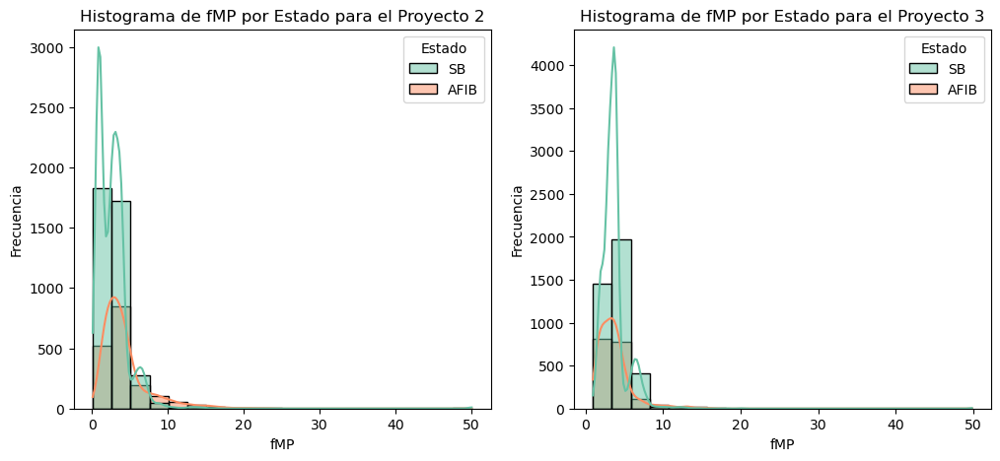

In [115]:
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Primer histograma
sns.histplot(df_proyecto2, x='fMP', hue='Estado', bins=20, kde=True, legend=True, ax=axs[0], palette='Set2', edgecolor='black')
axs[0].set_title('Histograma de fMP por Estado para el Proyecto 2')
axs[0].set_xlabel('fMP')
axs[0].set_ylabel('Frecuencia')

# Segundo histograma
sns.histplot(df_resultados, x='fMP', hue='Estado', bins=20, kde=True, legend=True, ax=axs[1], palette='Set2', edgecolor='black')
axs[1].set_title('Histograma de fMP por Estado para el Proyecto 3')
axs[1].set_xlabel('fMP')
axs[1].set_ylabel('Frecuencia')

plt.show()


El histograma revela que tanto las señales procesadas con el flujo propuesto como las señales del Proyecto 2 no siguen una distribución normal, lo cual se validará posteriormente mediante pruebas inferenciales. Además, al igual que en los resultados del Proyecto 2, en el histograma de las señales procesadas se aprecian diferencias entre SB y AfIB. La AFIB presentó un pico más pronunciado en frecuencias altas, mientras que en SB las frecuencias con potencia significativa se agrupan en rangos más bajos. Sin embargo, en las señales procesadas con el flujo propuesto se observan picos más definidos, lo que sugiere una mayor efectividad en la reducción de ruido y, por ende, una mejor capacidad para resaltar las diferencias.

### ***Caja de bigotes***

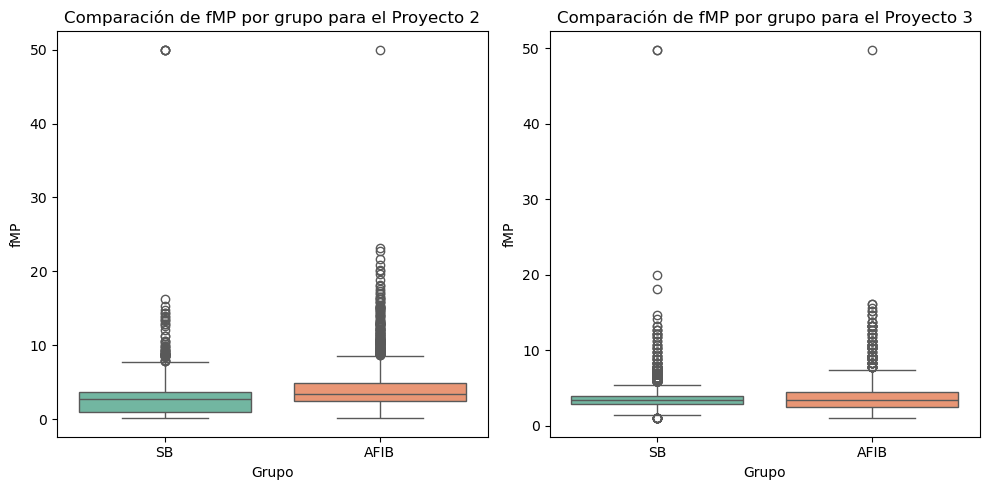

In [116]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Primer boxplot
sns.boxplot(data=df_proyecto2, x='Estado', y='fMP', palette="Set2", hue='Estado', legend=False, ax=axs[0])
axs[0].set_title('Comparación de fMP por grupo para el Proyecto 2')
axs[0].set_xlabel('Grupo')
axs[0].set_ylabel('fMP')

# Segundo boxplot
sns.boxplot(data=df_resultados, x='Estado', y='fMP', palette="Set2", hue='Estado', legend=False, ax=axs[1])
axs[1].set_title('Comparación de fMP por grupo para el Proyecto 3')
axs[1].set_xlabel('Grupo')
axs[1].set_ylabel('fMP')

plt.tight_layout()
plt.show()


Al analizar el diagrama de bigotes, se observó que tanto las señales del Proyecto 2 como las procesadas con el flujo propuesto muestran que las señales de SB tienen una mediana cercana a 4 Hz, mientras que las de AFIB presentan una mediana ligeramente más alta, alrededor de 5 Hz, lo cual es característico de estas patologías. Por otro lado, en las señales procesadas con el flujo propuesto, las cajas son más compactas en comparación con las del Proyecto 2, lo que indica una menor variabilidad de los datos. Además, se observó una reducción en la presencia de datos atípicos en las señales de AFIB procesadas con el flujo propuesto.

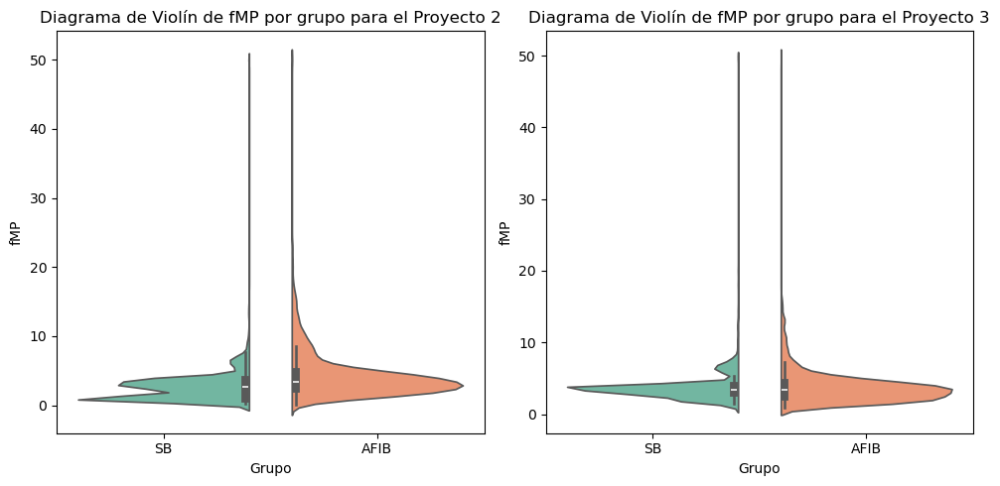

In [118]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

# Primer diagrama de violín para el Proyecto 2
sns.violinplot(data=df_proyecto2, x='Estado', y='fMP', palette="Set2", hue='Estado', split=True, ax=axs[0])
axs[0].set_title('Diagrama de Violín de fMP por grupo para el Proyecto 2')
axs[0].set_xlabel('Grupo')
axs[0].set_ylabel('fMP')
axs[0].legend([],[], frameon=False)  # Quitar leyenda extra en el primer gráfico

# Segundo diagrama de violín para el Proyecto 3
sns.violinplot(data=df_resultados, x='Estado', y='fMP', palette="Set2", hue='Estado', split=True, ax=axs[1])
axs[1].set_title('Diagrama de Violín de fMP por grupo para el Proyecto 3')
axs[1].set_xlabel('Grupo')
axs[1].set_ylabel('fMP')
axs[1].legend([],[], frameon=False)  # Quitar leyenda extra en el segundo gráfico

plt.tight_layout()
plt.show()


En los proyectos 2 y 3, se observa un patrón distintivo en la distribución de los valores fMP entre los grupos SB y AFIB. El grupo SB muestra una concentración significativa de valores fMP cercanos a cero, con una densidad que disminuye gradualmente conforme aumentan los valores de fMP, lo que indica que este grupo se mantiene predominantemente en un rango bajo.
En contraste, el grupo AFIB, aunque también presenta una considerable cantidad de valores bajos de fMP, exhibe una mayor dispersión en su distribución, como se evidencia en la forma más expandida del diagrama de violín.
Si bien las diferencias entre ambos grupos pueden no ser inmediatamente evidentes, un análisis detallado revela variaciones sutiles pero significativas en la densidad de los valores fMP, particularmente en ciertas regiones de la distribución. Se puede observar que la distribución de los datos para las señales del proyecto 2 es un poco más ancha, lo que indica una mayor variabilidad en los valores en comparación con el proyecto 3



## ***Análisis inferencial***

In [97]:
# Extracción de los valores fMP del proyecto 3

fMP3_SB = df_resultados[df_resultados["Estado"] == "SB"][["Estado", "fMP"]]
SB_fMP_P3 = fMP3_SB['fMP'].values  # Cambié fMP_SB a fMP3_SB

fMP3_AFIB = df_resultados[df_resultados["Estado"] == "AFIB"][["Estado", "fMP"]]
AFIB_fMP_P3 = fMP3_AFIB['fMP'].values  # Cambié fMP_AFIB a fMP3_AFIB

# Extracción de los valores fMP para el proyecto 2

fMP2_AFIB = df_proyecto2[df_proyecto2["Estado"] == "AFIB"][["Estado", "fMP"]]
AFIB_fMP_P2 = fMP2_AFIB['fMP'].values

fMP2_SB = df_proyecto2[df_proyecto2["Estado"] == "SB"][["Estado", "fMP"]]
SB_fMP_P2 = fMP2_SB['fMP'].values


Para determinar qué prueba deberíamos utilizar para hacer la comparación entre ambos grupos para cada métrica, inicialmente se verifica si se cumple con los supuestos para utilizar muestras paramétricas. 

#### *Prueba de normalidad: Kolmogorov-Smirnov para cada proyecto y cada estado*

Dado que el tamaño de muestra es robusto (n > 5000 datos), se hará una prueba de Kolmogorov Smirnov, que es ideal para una gran cantidad de datos

**Hipótesis prueba de normalidad**

**Ho:** Los datos siguen una distribución normal.

**Ha:** Los datos no siguen una distribución normal

Prueba de normalidad para SB y AFIB proyecto 3

In [98]:
from scipy import stats
import numpy as np

# Calcula la media y desviación estándar de los datos
mean_SB_fMP_P3 = np.mean(SB_fMP_P3)
std_SB_fMP_P3 = np.std(SB_fMP_P3)

# Prueba de normalidad con Kolmogorov-Smirnov usando la media y desviación estándar de los datos
stat_normalidad_fMP_SB, p_n_fMP_SB = stats.kstest(SB_fMP_P3, 'norm', args=(mean_SB_fMP_P3, std_SB_fMP_P3))
print(f'P-valor para fMP para el grupo con SB es: {p_n_fMP_SB:.4f}')

# Nivel de significancia
alfa = 0.05
if p_n_fMP_SB > alfa:
    print('No se rechaza la hipótesis nula. Los datos de fMP del grupo con SB del proyecto 3 siguen una distribución normal.')
else:
    print('Se rechaza la hipótesis nula. Los datos de fMP del grupo con SB del proyecto 3 no siguen una distribución normal.')


P-valor para fMP para el grupo con SB es: 0.0000
Se rechaza la hipótesis nula. Los datos de fMP del grupo con SB del proyecto 3 no siguen una distribución normal.


In [99]:
# Prueba de normalidad con Shapiro-Wilk
stat_shapiro, p_shapiro = stats.shapiro(SB_fMP_P3)
print(f'P-valor para fMP con prueba Shapiro-Wilk en SB es: {p_shapiro:.4f}')


P-valor para fMP con prueba Shapiro-Wilk en SB es: 0.0000


In [100]:
stat_normalidad_fMP_SB, p_n_fMP_SB = stats.kstest(SB_fMP_P3, 'norm')
print(f'P-valor para fMP para el grupo con SB es: {p_n_fMP_SB:.4f}')
alfa = 0.05  # Nivel de significancia
if p_n_fMP_SB > alfa:
    print('No se rechaza la hipótesis nula. Los datos de fMP del grupo con SB  del proyecto 3 siguen una distribución normal.')
else:
    print('Se rechaza la hipótesis nula. Los datos de fMP del grupo con SB del proyecto 3 no siguen una distribución normal.')

P-valor para fMP para el grupo con SB es: 0.0000
Se rechaza la hipótesis nula. Los datos de fMP del grupo con SB del proyecto 3 no siguen una distribución normal.


In [101]:
stat_normalidad_fMP_AFIB, p_n_fMP_AFIB = stats.kstest(AFIB_fMP_P3, 'norm')
print(f'P-valor para fMP para el grupo con AFIB es: {p_n_fMP_AFIB:.4f}')
alfa = 0.05  # Nivel de significancia
if p_n_fMP_AFIB > alfa:
    print('No se rechaza la hipótesis nula. Los datos de fMP del grupo con AFIB  del proyecto 3 siguen una distribución normal.')
else:
    print('Se rechaza la hipótesis nula. Los datos de fMP del grupo con AFIB del proyecto 3 no siguen una distribución normal.')

P-valor para fMP para el grupo con AFIB es: 0.0000
Se rechaza la hipótesis nula. Los datos de fMP del grupo con AFIB del proyecto 3 no siguen una distribución normal.


##### *Prueba de normalidad para SB y AFIB proyecto 2*

In [102]:
stat_normalidad_fMP_SB_P2, p_n_fMP_SB_P2 = stats.kstest(SB_fMP_P2, 'norm')
print(f'P-valor para fMP para el grupo con SB es: {p_n_fMP_SB_P2:.4f}')
alfa = 0.05  # Nivel de significancia
if p_n_fMP_SB_P2 > alfa:
    print('No se rechaza la hipótesis nula. Los datos fMP del grupo con SB  del proyecto 2 siguen una distribución normal.')
else:
    print('Se rechaza la hipótesis nula. Los datos fMP del grupo con SB del proyecto 2 no siguen una distribución normal.')

P-valor para fMP para el grupo con SB es: 0.0000
Se rechaza la hipótesis nula. Los datos fMP del grupo con SB del proyecto 2 no siguen una distribución normal.


In [103]:
stat_normalidad_fMP_SB_P2, p_n_fMP_AFIB_P2 = stats.kstest(AFIB_fMP_P2, 'norm')
print(f'P-valor para fMP para el grupo con SB es: {p_n_fMP_AFIB_P2:.4f}')
alfa = 0.05  # Nivel de significancia
if p_n_fMP_AFIB_P2 > alfa:
    print('No se rechaza la hipótesis nula. Los datos fMP del grupo con AFIB del proyecto 2 siguen una distribución normal.')
else:
    print('Se rechaza la hipótesis nula. Los datos fMP del grupo con AFIB del proyecto 2 no siguen una distribución normal.')

P-valor para fMP para el grupo con SB es: 0.0000
Se rechaza la hipótesis nula. Los datos fMP del grupo con AFIB del proyecto 2 no siguen una distribución normal.


Dado que las variables no siguen una distribución normal, una de las pruebas recomendadas para evaluar la homocedasticidad es la Prueba de Levene.
Si el valor p de la prueba de Levene es superior a 0.05, las varianzas no son significativamente diferentes entre sí (es decir, se cumple el supuesto de homogeneidad de la varianza). Si el valor p de la prueba de Levene es inferior a 0.05, entonces existe una diferencia significativa entre las varianzas.

#### *Prueba de homocedasticidad: Levene*

**Hipótesis prueba de homocedasticidad**

**Ho:** Los datos tienen varianzas iguales.

**Ha:** Los datos no tienen varianzas iguales.

In [104]:
fMP_P3 = df_resultados["fMP"]
fMP_P2 = df_proyecto2["fMP"]
stat_homogeneidad_sFSB_fMP, p_valor_homogeniedad_sFSB_fMP = stats.levene(fMP_P3, fMP_P2, center='median')
print(f'P-valor: {p_valor_homogeniedad_sFSB_fMP:.4f}')
alfa = 0.05  # Nivel de significancia
if p_valor_homogeniedad_sFSB_fMP > alfa:
  print('No se rechaza la hipótesis nula. Los datos de fMP para los dos proyectos proceden de distribuciones con la misma varianza.')
else:
  print('Se rechaza la hipótesis nula. Los datos de fMP para los dos proyectos no proceden de distribuciones con la misma varianza.')

P-valor: 0.0000
Se rechaza la hipótesis nula. Los datos de fMP para los dos proyectos no proceden de distribuciones con la misma varianza.


## *Supuesto de independencia*
Ya que los grupos representan poblaciones distintas, con diferentes condiciones clínicas, en este caso de arritmia, se asume que cumplen con el supuesto de independencia. Adicionalmente, los datos de ECG de ambos proyectos fueron tratados de manera independiente. 

Dado que no se cumplen con los supuestos requeridos para realizar una prueba paramétrica que permita realizar una comparación de los datos, se empleará la prueba no paramétrica U de Mann-Whitney para identificar si las métricas evaluadas entregan información diferencial entre los dos estados (SB y AFIB). Se considera que es adecuada ya que el objetivo es hacer la comparación entre dos grupos que no siguen una distribución normal.

#### *Prueba no paramétrica: U de Mann-Whitney*

Las características que los datos deben tener para poder ser analizados por la prueba U de Mann Whitney son: 

**1.** La variable dependiente debe medirse a nivel ordinal o continuo.

**2.** La variable independiente debe consistir en dos grupos.

**3.** Debe haber independencia de las observaciones de cada grupo.

**4.** Las dos variables se distribuyen de forma anormal.

In [119]:
from scipy import stats

# Definimos el nivel de significancia
alfa = 0.05

# Primera prueba: Comparación entre SB y AFIB en el Proyecto 2
stat_np_fMP_2, p_np_fMP_2 = stats.mannwhitneyu(SB_fMP_P2, AFIB_fMP_P2, alternative='two-sided')
if p_np_fMP_2 < alfa:
    print(f'''p value = {p_np_fMP_2} 
Se rechaza la hipótesis nula. La fMP difiere significativamente entre estados (SB y AFIB) en el Proyecto 2''')
else:
    print(f'''p value = {p_np_fMP_2} 
No hay suficiente evidencia para rechazar la hipótesis nula. La fMP no difiere entre estados (SB y AFIB) en el Proyecto 2''')

# Segunda prueba: Comparación entre las frecuencias de máxima potencia de SB del Proyecto 2 y SB del Proyecto 3
stat_np_fMP_SB, p_np_fMP_SB = stats.mannwhitneyu(SB_fMP_P2, SB_fMP_P3, alternative='two-sided')
if p_np_fMP_SB < alfa:
    print(f'''p value = {p_np_fMP_SB} 
Se rechaza la hipótesis nula. La fMP difiere significativamente entre los estados SB de los Proyectos 2 y 3''')
else:
    print(f'''p value = {p_np_fMP_SB} 
No hay suficiente evidencia para rechazar la hipótesis nula. La fMP no difiere entre los estados SB de los Proyectos 2 y 3''')

# Tercera prueba: Comparación entre las frecuencias de máxima potencia de AFIB del Proyecto 2 y AFIB del Proyecto 3
stat_np_fMP_AFIB, p_np_fMP_AFIB = stats.mannwhitneyu(AFIB_fMP_P2, AFIB_fMP_P3, alternative='two-sided')
if p_np_fMP_AFIB < alfa:
    print(f'''p value = {p_np_fMP_AFIB} 
Se rechaza la hipótesis nula. La fMP difiere significativamente entre los estados AFIB de los Proyectos 2 y 3''')
else:
    print(f'''p value = {p_np_fMP_AFIB} 
No hay suficiente evidencia para rechazar la hipótesis nula. La fMP no difiere entre los estados AFIB de los Proyectos 2 y 3''')

# cuarte prueba: Comparación entre SB y AFIB en el Proyecto 3
stat_np_fMP_3, p_np_fMP_3 = stats.mannwhitneyu(SB_fMP_P3, AFIB_fMP_P3, alternative='two-sided')
if p_np_fMP_3 < alfa:
    print(f'''p value = {p_np_fMP_3} 
Se rechaza la hipótesis nula. La fMP difiere significativamente entre estados (SB y AFIB) en el Proyecto 3''')
else:
    print(f'''p value = {p_np_fMP_3} 
No hay suficiente evidencia para rechazar la hipótesis nula. La fMP no difiere entre estados (SB y AFIB) en el Proyecto 3''')



p value = 2.8670168849961355e-118 
Se rechaza la hipótesis nula. La fMP difiere significativamente entre estados (SB y AFIB) en el Proyecto 2
p value = 6.522425532133907e-277 
Se rechaza la hipótesis nula. La fMP difiere significativamente entre los estados SB de los Proyectos 2 y 3
p value = 0.002550685828672155 
Se rechaza la hipótesis nula. La fMP difiere significativamente entre los estados AFIB de los Proyectos 2 y 3
p value = 0.0006095453757750611 
Se rechaza la hipótesis nula. La fMP difiere significativamente entre estados (SB y AFIB) en el Proyecto 3


## *Discusión*

Las enfermedades cardiovasculares son una de las principales causas de muerte en todo el mundo. Patologías como la arritmia, que se refiere a un ritmo cardíaco anormal, son de las afecciones más comunes. Entre los tipos de arritmias, destaca la fibrilación auricular (AFIB), donde las aurículas laten de forma caótica e irregular, sin sincronización con los ventrículos. Esta condición es una de las más frecuentes y, al mismo tiempo, de las menos detectables, ya que puede ser asintomática. Para la detección temprana de la fibrilación auricular es necesario realizar un monitoreo continuo, esto puede reducir significativamente el riesgo de sufrir accidentes cerebrovasculares [7]. Por otro lado, la bradicardia sinusal (SB) es otra afección común, pero a diferencia de la AFIB, en la SB el corazón late a una frecuencia más baja de lo normal, lo que dificulta el suministro adecuado de sangre al cuerpo [8].

Este comportamiento se observó tanto en el flujo de procesamiento propuesto como en los resultados obtenidos en el Proyecto 2. En cuanto a la frecuencia, los histogramas revelaron que el rango de frecuencias es más estrecho en los sujetos con bradicardia sinusal (SB), quienes presentan una frecuencia cardíaca más baja, en comparación con los sujetos con fibrilación auricular (AFIB), que muestran una frecuencia cardíaca más irregular. En términos de la magnitud de la potencia, las señales de bradicardia sinusal tienden a mostrar una mayor magnitud. En las señales procesadas con el flujo propuesto, los picos se presentan de forma más definida, lo que sugiere una mayor efectividad en la reducción de ruido y una mejor capacidad para resaltar las diferencias. Por otro lado, tanto en el diagrama de bigotes como en el diagrama de violín, las señales procesadas con el flujo propuesto presentan cajas más compactas en comparación con las del Proyecto 2, lo que sugiere una menor variabilidad de los datos. 

Por lo anterior, se esperaba que las señales procesadas con el flujo propuesto fueran capaces de diferenciar de manera más clara las patologías SB y AFIB en comparación con los resultados obtenidos en el Proyecto 2. Sin embargo, al realizar las pruebas inferenciales, no se llegó a esta conclusión. Este hallazgo contradice la interpretación inicial basada únicamente en la visualización de datos y destaca la importancia de combinar el análisis visual con métodos estadísticos inferenciales.
Para el análisis inferencial, se iniciaron con las pruebas de normalidad de Kolmogorov-Smirnov y Shapiro-Wilk, que indicaron que los datos no seguían una distribución normal. Además, se realizó una prueba de homocedasticidad, que reveló que los datos no provenían de distribuciones con la misma varianza. En consecuencia, se aplicó la prueba U de Mann-Whitney para comparar las diferencias entre las señales procesadas con el flujo propuesto y las señales utilizadas en el Proyecto 2, enfocándose en el valor de la frecuencia de máxima potencia (FMP).
Al comparar los valores de FMP obtenidos entre ambos proyectos para cada patología, se observó que las señales del Proyecto 2 presentaron un valor de p significativamente menor (p = 2.8670168849961355e-118) en la discriminación entre SB y AFIB, lo que indica una mayor capacidad para diferenciar entre estas patologías en comparación con las señales procesadas con el flujo propuesto.
Adicionalmente, al comparar los valores de FMP obtenidos para cada estado (SB y AFIB) entre ambos proyectos, se evidenció que el procesamiento aplicado en el nuevo flujo afectó significativamente las características espectrales de la señal, tanto para los registros con AFIB (p = 0.0000854537579750613) como para SB (p = 6.524249513359967e-272). Estos resultados sugieren que, aunque el nuevo procesamiento modificó las características de la señal, no mejoró la capacidad discriminativa entre patologías respecto al Proyecto 2.
Por lo anterior, el análisis comparativo entre las señales del Proyecto 2 y las señales procesadas con el flujo propuesto para la diferenciación de patologías cardíacas reveló que las señales del Proyecto 2 tienen una mayor capacidad estadística para distinguir entre bradicardia sinusal y fibrilación auricular, lo que las hace más confiables para sistemas de diagnóstico. Este resultado se atribuye a las diferencias en el procesamiento de las señales y a las variaciones en las características del ECG. En consecuencia, se concluye que es necesario incorporar pasos adicionales en el procesamiento de las señales ECG crudas, como la eliminación de ruido y la mejora de la resolución temporal, así como realizar más comparaciones utilizando diferentes órdenes, ventanas y funciones wavelet. Además, se deben estudiar el uso de técnicas avanzadas de filtrado y segmentación para extraer características más representativas que permitan lograr mejores resultados en la diferenciación de estas patologías.

## *Conclusiones*

* La implementación del flujo de procesamiento, que incorpora una secuencia estratégica de filtros pasa-altas, transformada wavelet y filtros pasa-bajas, demuestra ser efectiva para la depuración y estabilización de señales ECG, facilitando una limpieza profunda del ruido y optimizando las etapas subsecuentes de preprocesamiento. Sin embargo, el análisis inferencial reveló que, a pesar de las modificaciones significativas en las características espectrales de las señales, este procesamiento no mejoró la capacidad discriminativa entre patologías en comparación con metodologías anteriores. Estos resultados sugieren la necesidad de incorporar técnicas adicionales de filtrado y segmentación, así como explorar diferentes configuraciones de wavelet para mejorar la diferenciación entre patologías cardíacas. La optimización de esta metodología podría resultar en una herramienta más robusta para aplicaciones clínicas y de investigación, donde la precisión en la discriminación de patologías es fundamental.
* A pesar de que los análisis visuales como los histogramas y diagramas de bigotes, mostraron diferencias claras en la magnitud de la potencia y la variabilidad entre las señales, los métodos estadísticos inferenciales revelaron que las diferencias no eran tan marcadas como se esperaban. Por lo tanto, se destaca la necesidad de integrar los análisis visuales con pruebas estadísticas inferenciales para realizar análisis más precisos y confiables.






## *Referencias*

**[1]** M. A. Alzate, “Análisis de Señales y Sistemas”, Univ. Dist. Francisco Jose Caldas, 2014. [En línea]. Disponible: https://comunidad.udistrital.edu.co/malzate/files/2014/05/Filtros_muestreo_modelo.pdf

**[2]** J. M. M. De la Rosa, “FUNDAMENTOS TEÓRICOS: FILTROS”, Univ. Sevilla, s. f. [En línea]. Disponible: https://biblus.us.es/bibing/proyectos/abreproy/11375/fichero/MEMORIA%2FFundamentos+teoricos.pdf
